#### Import packages

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

temp = pd.read_csv("stage3.csv")

In [41]:
# temp1 = temp.dropna(subset = "gun_type")

In [65]:
#Organzied by State and time

temp = temp.sort_values(by=['state', "date"])

temp = temp.drop(columns=["incident_url", "address", "source_url", "incident_url_fields_missing", "incident_characteristics", "location_description", "notes", "sources", "state_house_district",
            "state_senate_district", "participant_name", "congressional_district"])

#### Description of variables used

In [66]:
temp.head(n=5)

,incident_id,date,state,city_or_county,n_killed,n_injured,gun_stolen,gun_type,latitude,longitude,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type
127,490395,2013-07-06,Alabama,Florence,0,4,NaN,NaN,34.7982,-87.6854,NaN,4::22,4::Adult 18+,4::Female,NaN,0::Injured||1::Injured||2::Injured||3::Injured...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
272,496668,2013-12-28,Alabama,Montgomery,3,5,NaN,NaN,32.3719,-86.2952,NaN,0::21||1::22||2::20||3::20||4::23||5::20||6::2...,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male||4::Male|...,9::Mass shooting - Random victims,0::Killed||1::Killed||2::Injured||3::Injured||...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
296,92342,2014-01-01,Alabama,Huntsville,1,0,NaN,NaN,34.7663,-86.6028,NaN,0::21||1::24,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect
315,94194,2014-01-01,Alabama,Tuscaloosa,0,3,NaN,NaN,33.2482,-87.5670,NaN,3::17||4::19||5::19||6::19,3::Teen 12-17||4::Adult 18+||5::Adult 18+||6::...,0::Male||1::Male||2::Female||3::Male||4::Male|...,NaN,0::Injured||1::Injured||2::Injured||3::Unharme...,0::Victim||1::Victim||2::Victim||3::Subject-Su...
320,92337,2014-01-01,Alabama,Crenshaw,1,0,NaN,NaN,31.7839,-86.1926,NaN,0::18||1::19,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect


* incident_id	- ID of shooting incident
* date - date of incident
* state - state incident occured	
* city_or_county - city or county where incident occured	
* n_killed - number of people killed
* n_injured - number of people injured
* congressional_district - district where incident occured
* gun_stolen - guns stolen, unknown, or not stolen
* gun_type - type of gun involved
* n_guns_involved	- number of guns involved
* participant_age	- participants age, killed, injured, or assailant
* participant_age_group - age group of participants
* participant_gender	- gender of participants
* participant_relationship - participant relationships to other participants
* participant_status - participant status: 'Arrested', 'Killed', 'Injured', or 'Unharmed'
* participant_type - particpant type:  'Victim' or 'Subject-Suspect

#### Data cleaning process

In [67]:
## Checking the data type of columns

temp.dtypes

temp.info(verbose=True)

##  re-indexing the dataframe

temp = temp.reset_index(drop=True)

temp.head(n=5)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 239677 entries, 127 to 239153
Data columns (total 17 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   incident_id               239677 non-null  int64  
 1   date                      239677 non-null  object 
 2   state                     239677 non-null  object 
 3   city_or_county            239677 non-null  object 
 4   n_killed                  239677 non-null  int64  
 5   n_injured                 239677 non-null  int64  
 6   gun_stolen                140179 non-null  object 
 7   gun_type                  140226 non-null  object 
 8   latitude                  231754 non-null  float64
 9   longitude                 231754 non-null  float64
 10  n_guns_involved           140226 non-null  float64
 11  participant_age           147379 non-null  object 
 12  participant_age_group     197558 non-null  object 
 13  participant_gender        203315 non-null 

,incident_id,date,state,city_or_county,n_killed,n_injured,gun_stolen,gun_type,latitude,longitude,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type
0,490395,2013-07-06,Alabama,Florence,0,4,NaN,NaN,34.7982,-87.6854,NaN,4::22,4::Adult 18+,4::Female,NaN,0::Injured||1::Injured||2::Injured||3::Injured...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
1,496668,2013-12-28,Alabama,Montgomery,3,5,NaN,NaN,32.3719,-86.2952,NaN,0::21||1::22||2::20||3::20||4::23||5::20||6::2...,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male||4::Male|...,9::Mass shooting - Random victims,0::Killed||1::Killed||2::Injured||3::Injured||...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
2,92342,2014-01-01,Alabama,Huntsville,1,0,NaN,NaN,34.7663,-86.6028,NaN,0::21||1::24,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect
3,94194,2014-01-01,Alabama,Tuscaloosa,0,3,NaN,NaN,33.2482,-87.5670,NaN,3::17||4::19||5::19||6::19,3::Teen 12-17||4::Adult 18+||5::Adult 18+||6::...,0::Male||1::Male||2::Female||3::Male||4::Male|...,NaN,0::Injured||1::Injured||2::Injured||3::Unharme...,0::Victim||1::Victim||2::Victim||3::Subject-Su...
4,92337,2014-01-01,Alabama,Crenshaw,1,0,NaN,NaN,31.7839,-86.1926,NaN,0::18||1::19,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect


In [75]:
# ## Note gun_stolen column values is a string, but with inner and outer separators, according to James' Gun Violence data repo

## But let's make sure that it is in a string format

temp1 = temp.astype({'gun_stolen':str})

## Now create a function to take care of || and :: ....

text_list = [] 
def extract(x):
    """This is a recursive function to extract text separated by ||"""
    ch = '|'
    if ch not in x:
        for i in range(len(x)):
            if x[i] == ":" and x[i+1] == ":":
                text = x[i+2:]
                text_list.append(text)
                return text_list
    else:
        for i in range(len(x)):
            if x[i] == '|' and x[i+1] == '|':
                first_text = x[0:i]
                for j in range(len(first_text)):
                    if first_text[j] == ":" and first_text[j+1] == ":":
                        better_text = first_text[j+2:]
                        text_list.append(better_text)
                        break
                newtext = x[i+2:]
                extract(newtext)
                break
        return text_list


In [76]:
## Now apply extract function to gun_stolen column

for i in range(len(temp1)):
    stats = temp1.loc[i, 'gun_stolen']
    text_list = []
    complete_list = extract(stats)
    temp1.at[i, 'gun_stolen'] = complete_list
    

In [77]:
temp1.head(5)

,incident_id,date,state,city_or_county,n_killed,n_injured,gun_stolen,gun_type,latitude,longitude,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type
0,490395,2013-07-06,Alabama,Florence,0,4,None,NaN,34.7982,-87.6854,NaN,4::22,4::Adult 18+,4::Female,NaN,0::Injured||1::Injured||2::Injured||3::Injured...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
1,496668,2013-12-28,Alabama,Montgomery,3,5,None,NaN,32.3719,-86.2952,NaN,0::21||1::22||2::20||3::20||4::23||5::20||6::2...,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male||4::Male|...,9::Mass shooting - Random victims,0::Killed||1::Killed||2::Injured||3::Injured||...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
2,92342,2014-01-01,Alabama,Huntsville,1,0,None,NaN,34.7663,-86.6028,NaN,0::21||1::24,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect
3,94194,2014-01-01,Alabama,Tuscaloosa,0,3,None,NaN,33.2482,-87.5670,NaN,3::17||4::19||5::19||6::19,3::Teen 12-17||4::Adult 18+||5::Adult 18+||6::...,0::Male||1::Male||2::Female||3::Male||4::Male|...,NaN,0::Injured||1::Injured||2::Injured||3::Unharme...,0::Victim||1::Victim||2::Victim||3::Subject-Su...
4,92337,2014-01-01,Alabama,Crenshaw,1,0,None,NaN,31.7839,-86.1926,NaN,0::18||1::19,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect


In [78]:
## Replacing Null/NA values with "Unknown"

maximum = 0
for i in range(len(temp1)):
    l = temp1.loc[i, 'gun_stolen']
    if not l:
        l = ["Unknown"]
        temp1.at[i, 'gun_stolen'] = l
    

In [82]:
# Let's expand the dataframe to include three more columns

temp1[["Number_Unknown_Guns", "Number_Stolen_Guns", "Number_Not_Stolen_Guns"]] = None

In [83]:
temp1.head(5)

,incident_id,date,state,city_or_county,n_killed,n_injured,gun_stolen,gun_type,latitude,longitude,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type,Number_Unknown_Guns,Number_Stolen_Guns,Number_Not_Stolen_Guns
0,490395,2013-07-06,Alabama,Florence,0,4,[Unknown],NaN,34.7982,-87.6854,NaN,4::22,4::Adult 18+,4::Female,NaN,0::Injured||1::Injured||2::Injured||3::Injured...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,None,None,None
1,496668,2013-12-28,Alabama,Montgomery,3,5,[Unknown],NaN,32.3719,-86.2952,NaN,0::21||1::22||2::20||3::20||4::23||5::20||6::2...,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male||4::Male|...,9::Mass shooting - Random victims,0::Killed||1::Killed||2::Injured||3::Injured||...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,None,None,None
2,92342,2014-01-01,Alabama,Huntsville,1,0,[Unknown],NaN,34.7663,-86.6028,NaN,0::21||1::24,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect,None,None,None
3,94194,2014-01-01,Alabama,Tuscaloosa,0,3,[Unknown],NaN,33.2482,-87.5670,NaN,3::17||4::19||5::19||6::19,3::Teen 12-17||4::Adult 18+||5::Adult 18+||6::...,0::Male||1::Male||2::Female||3::Male||4::Male|...,NaN,0::Injured||1::Injured||2::Injured||3::Unharme...,0::Victim||1::Victim||2::Victim||3::Subject-Su...,None,None,None
4,92337,2014-01-01,Alabama,Crenshaw,1,0,[Unknown],NaN,31.7839,-86.1926,NaN,0::18||1::19,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect,None,None,None


In [84]:
# Rearranging the columns so the newly added columns are next to gun_stolen

temp2 = temp1[['incident_id', 'date', 'state', 'city_or_county', 'n_killed', 'n_injured', 'gun_stolen', 
'Number_Unknown_Guns', 'Number_Stolen_Guns', 'Number_Not_Stolen_Guns', 'gun_type', 'n_guns_involved', 'participant_age', 'participant_age_group', 
'participant_gender', 'participant_relationship', 'participant_status', 'participant_type']]

In [85]:
# Let's create a dictionary of items in gun_stolen and count them. Then put appropriate numbers in appropriate columns
for i in range(len(temp2)):
    gunstolen_list = temp2.loc[i, 'gun_stolen']
    gunstolen_dict = {}
    for j in gunstolen_list:
        gunstolen_dict[j] = gunstolen_dict.get(j, 0) + 1
    temp2.at[i, 'Number_Unknown_Guns'] = gunstolen_dict.get('Unknown')
    temp2.at[i, 'Number_Stolen_Guns'] = gunstolen_dict.get('Stolen')
    temp2.at[i, 'Number_Not_Stolen_Guns'] = gunstolen_dict.get('Not-Stolen')



In [86]:
temp2.head(5)

,incident_id,date,state,city_or_county,n_killed,n_injured,gun_stolen,Number_Unknown_Guns,Number_Stolen_Guns,Number_Not_Stolen_Guns,gun_type,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type
0,490395,2013-07-06,Alabama,Florence,0,4,[Unknown],1,None,None,NaN,NaN,4::22,4::Adult 18+,4::Female,NaN,0::Injured||1::Injured||2::Injured||3::Injured...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
1,496668,2013-12-28,Alabama,Montgomery,3,5,[Unknown],1,None,None,NaN,NaN,0::21||1::22||2::20||3::20||4::23||5::20||6::2...,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male||4::Male|...,9::Mass shooting - Random victims,0::Killed||1::Killed||2::Injured||3::Injured||...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
2,92342,2014-01-01,Alabama,Huntsville,1,0,[Unknown],1,None,None,NaN,NaN,0::21||1::24,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect
3,94194,2014-01-01,Alabama,Tuscaloosa,0,3,[Unknown],1,None,None,NaN,NaN,3::17||4::19||5::19||6::19,3::Teen 12-17||4::Adult 18+||5::Adult 18+||6::...,0::Male||1::Male||2::Female||3::Male||4::Male|...,NaN,0::Injured||1::Injured||2::Injured||3::Unharme...,0::Victim||1::Victim||2::Victim||3::Subject-Su...
4,92337,2014-01-01,Alabama,Crenshaw,1,0,[Unknown],1,None,None,NaN,NaN,0::18||1::19,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect


In [87]:
#Transform None to 0s
target = ['Number_Unknown_Guns', 'Number_Stolen_Guns','Number_Not_Stolen_Guns']
for t in target:
    temp2[t] = temp2[t].fillna(0)
    
temp2.tail(10)

/var/folders/r_/hnds4s357nn25pr5758mxqh40000gn/T/ipykernel_13864/1598385824.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp2[t] = temp2[t].fillna(0)


,incident_id,date,state,city_or_county,n_killed,n_injured,gun_stolen,Number_Unknown_Guns,Number_Stolen_Guns,Number_Not_Stolen_Guns,gun_type,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type
239667,1043611,2018-02-03,Wyoming,Douglas,1,0,[Unknown],1,0,0,0::Unknown,1.0,0::24,0::Adult 18+,0::Male,NaN,0::Killed,0::Victim
239668,1060924,2018-02-06,Wyoming,Cheyenne,0,0,[Unknown],1,0,0,0::308 Win||1::Rifle,2.0,NaN,NaN,NaN,NaN,NaN,NaN
239669,1057874,2018-02-25,Wyoming,Casper,1,0,[Unknown],1,0,0,0::Unknown,1.0,0::36,0::Adult 18+,0::Male,NaN,0::Killed,0::Subject-Suspect
239670,1064693,2018-03-01,Wyoming,Jackson (Jackson Hole),0,0,[Unknown],1,0,0,0::Handgun,1.0,NaN,NaN,NaN,NaN,NaN,NaN
239671,1067971,2018-03-10,Wyoming,Sheridan,1,0,[Unknown],1,0,0,0::Unknown,1.0,NaN,0::Adult 18+,0::Male,NaN,0::Killed,0::Victim
239672,1073419,2018-03-18,Wyoming,Casper,1,0,[Unknown],1,0,0,0::Unknown,1.0,0::49,0::Adult 18+,0::Male,NaN,0::Killed,0::Victim
239673,1076613,2018-03-19,Wyoming,Cheyenne,1,0,[Unknown],1,0,0,0::Unknown,1.0,NaN,0::Adult 18+,0::Male,NaN,0::Killed,0::Subject-Suspect
239674,1074675,2018-03-21,Wyoming,Casper,0,0,[Unknown],1,0,0,0::Unknown,1.0,0::20||1::22,0::Adult 18+||1::Adult 18+,0::Male||1::Male,NaN,"0::Unharmed, Arrested||1::Unharmed, Arrested",0::Subject-Suspect||1::Subject-Suspect
239675,1076607,2018-03-22,Wyoming,Glenrock,1,0,[Unknown],1,0,0,0::Handgun||1::Rifle,2.0,0::86,0::Adult 18+,0::Male,NaN,0::Killed,0::Subject-Suspect
239676,1079998,2018-03-28,Wyoming,Jackson (Jackson Hole),0,0,[Unknown],1,0,0,0::Rifle,1.0,NaN,NaN,NaN,NaN,NaN,NaN


In [88]:
### Let's clean the rest of the columns with ::

## Gun Type
temp2 = temp2.astype({'gun_type':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'gun_type']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'gun_type'] = complete_list

## Participant_Age
temp2 = temp2.astype({'participant_age':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_age']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_age'] = complete_list

## Participant Age Group
temp2 = temp2.astype({'participant_age_group':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_age_group']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_age_group'] = complete_list

## Participant Gender
temp2 = temp2.astype({'participant_gender':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_gender']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_gender'] = complete_list


## Participant Relationship
temp2 = temp2.astype({'participant_relationship':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_relationship']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_relationship'] = complete_list

## Participant Status

temp2 = temp2.astype({'participant_status':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_status']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_status'] = complete_list

## Participant Type

temp2 = temp2.astype({'participant_type':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_type']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_type'] = complete_list

temp2.tail(10)

,incident_id,date,state,city_or_county,n_killed,n_injured,gun_stolen,Number_Unknown_Guns,Number_Stolen_Guns,Number_Not_Stolen_Guns,gun_type,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type
239667,1043611,2018-02-03,Wyoming,Douglas,1,0,[Unknown],1,0,0,[Unknown],1.0,[24],[Adult 18+],[Male],None,[Killed],[Victim]
239668,1060924,2018-02-06,Wyoming,Cheyenne,0,0,[Unknown],1,0,0,"[308 Win, Rifle]",2.0,None,None,None,None,None,None
239669,1057874,2018-02-25,Wyoming,Casper,1,0,[Unknown],1,0,0,[Unknown],1.0,[36],[Adult 18+],[Male],None,[Killed],[Subject-Suspect]
239670,1064693,2018-03-01,Wyoming,Jackson (Jackson Hole),0,0,[Unknown],1,0,0,[Handgun],1.0,None,None,None,None,None,None
239671,1067971,2018-03-10,Wyoming,Sheridan,1,0,[Unknown],1,0,0,[Unknown],1.0,None,[Adult 18+],[Male],None,[Killed],[Victim]
239672,1073419,2018-03-18,Wyoming,Casper,1,0,[Unknown],1,0,0,[Unknown],1.0,[49],[Adult 18+],[Male],None,[Killed],[Victim]
239673,1076613,2018-03-19,Wyoming,Cheyenne,1,0,[Unknown],1,0,0,[Unknown],1.0,None,[Adult 18+],[Male],None,[Killed],[Subject-Suspect]
239674,1074675,2018-03-21,Wyoming,Casper,0,0,[Unknown],1,0,0,[Unknown],1.0,"[20, 22]","[Adult 18+, Adult 18+]","[Male, Male]",None,"[Unharmed, Arrested, Unharmed, Arrested]","[Subject-Suspect, Subject-Suspect]"
239675,1076607,2018-03-22,Wyoming,Glenrock,1,0,[Unknown],1,0,0,"[Handgun, Rifle]",2.0,[86],[Adult 18+],[Male],None,[Killed],[Subject-Suspect]
239676,1079998,2018-03-28,Wyoming,Jackson (Jackson Hole),0,0,[Unknown],1,0,0,[Rifle],1.0,None,None,None,None,None,None


In [102]:
### Finding all unique guns

unique_gun = []

for i in range(len(temp2)):
    guns = temp2.loc[i, 'gun_type']
    if guns:
        for i in guns:
            if i not in unique_gun:
                unique_gun.append(i)

print(f'all unique guns: {unique_gun}')

## Finding all participant age groups:

age_groups = []

for i in range(len(temp2)):
    age = temp2.loc[i, 'participant_age_group']
    if age:
        for i in age:
            if i not in age_groups:
                age_groups.append(i)

print(f'all unique age groups: {age_groups}')

## Finding all genders:

genders = []

for i in range(len(temp2)):
    g = temp2.loc[i, 'participant_gender']
    if g:
        for i in g:
            if i not in genders:
                genders.append(i)

print(f' all genders: {genders}')

## Finding all relationships

relationship = []

for i in range(len(temp2)):
    relate = temp2.loc[i, 'participant_relationship']
    if relate:
        for i in relate:
            if i not in relationship:
                relationship.append(i)

print(f' all relationships: {relationship}')


###### Finding all statuses

statuses = []

for i in range(len(temp2)):
    status = temp2.loc[i, 'participant_status']
    if status:
        for i in status:
            if i not in statuses:
                statuses.append(i)

print(f' all statuses: {statuses}')

## Replacing Null/NA values with "Unknown"

# maximum = 0
# for i in range(len(temp2)):
#     l = temp2.loc[i, 'participant_status']
#     if not l:
#         l = ["Unknown"]
#         temp2.at[i, 'participant_status'] = l

# # Let's create a dictionary of items in participant status and count them. 
# status_dict = {}
# for i in range(len(temp2)):
#     status_list = temp2.loc[i, 'participant_status']
#     for j in status_list:
#         status_dict[j] = status_dict.get(j, 0) + 1
#     # temp2.at[i, 'Number_Unknown_Guns'] = gunstolen_dict.get('Unknown')
#     # temp2.at[i, 'Number_Stolen_Guns'] = gunstolen_dict.get('Stolen')
#     # temp2.at[i, 'Number_Not_Stolen_Guns'] = gunstolen_dict.get('Not-Stolen')

# print(status_dict)


#### Finding all participant types

types = []

for i in range(len(temp2)):
    participants = temp2.loc[i, 'participant_type']
    if participants:
        for i in participants:
            if i not in types:
                types.append(i)

print(f'all participant types: {types}')

all unique guns: ['Unknown', '38 Spl', '12 gauge', 'Shotgun', 'Handgun', '22 LR', 'Rifle', '20 gauge', '7.62 [AK-47]', '9mm', '357 Mag', 'Other', '32 Auto', '25 Auto', '380 Auto', '45 Auto', '40 SW', '223 Rem [AR-15]', '30-30 Win', '44 Mag', '308 Win', '300 Win', '10mm', '16 gauge', '410 gauge', '30-06 Spr', '28 gauge']
all unique age groups: ['Adult 18+', 'Teen 12-17', 'Child 0-11']
 all genders: ['Female', 'Male', 'Male, female']
 all relationships: ['Mass shooting - Random victims', 'Family', 'Aquaintance', 'Friends', 'Home Invasion - Perp Knows Victim', 'Significant others - current or former', 'Armed Robbery', 'Neighbor', 'Home Invasion - Perp Does Not Know Victim', 'Mass shooting - Perp Knows Victims', 'Co-worker', 'Gang vs Gang', 'Drive by - Random victims']
 all statuses: ['Injured', 'Unharmed, Arrested', 'Killed', 'Unharmed', 'Unknown', 'Injured, Unharmed', 'Injured, Arrested', 'Arrested', 'Injured, Unharmed, Arrested', 'Killed, Arrested', 'Killed, Injured', 'Killed, Unharmed'

In [103]:
temp6 = temp2

### Exploratory Analysis

#### Description of dataset

In [104]:
temp6.describe()

,incident_id,n_killed,n_injured,Number_Unknown_Guns,Number_Stolen_Guns,Number_Not_Stolen_Guns,n_guns_involved
count,2.396770e+05,239677.000000,239677.000000,239677.0,239677.0,239677.0,140226.000000
mean,5.593343e+05,0.252290,0.494007,1.0,0.0,0.0,1.372442
std,2.931287e+05,0.521779,0.729952,0.0,0.0,0.0,4.678202
min,9.211400e+04,0.000000,0.000000,1.0,0.0,0.0,1.000000
25%,3.085450e+05,0.000000,0.000000,1.0,0.0,0.0,1.000000
50%,5.435870e+05,0.000000,0.000000,1.0,0.0,0.0,1.000000
75%,8.172280e+05,0.000000,1.000000,1.0,0.0,0.0,1.000000
max,1.083472e+06,50.000000,53.000000,1.0,0.0,0.0,400.000000


Here we see a description of the dataset with continuous variables. The average number of guns involved, injured, and killed are respectively, 0.25 killed, 0.45 injured, and 1.37 guns. We see that the largest number of guns involved in a mass shooting was 400, while the largest killing of a mass shooting was 50 killed. 

In [35]:
## Pair plot for by state for variables: number killed, number guns involved, congressional district, number injured
pair_df = temp6.drop(columns=["incident_id", "date", "city_or_county", "participant_age", "participant_age_group", 
                              "gun_stolen", "gun_type", "participant_age", "participant_age_group", "participant_gender", 
                              "participant_relationship", "participant_status", "participant_type"])


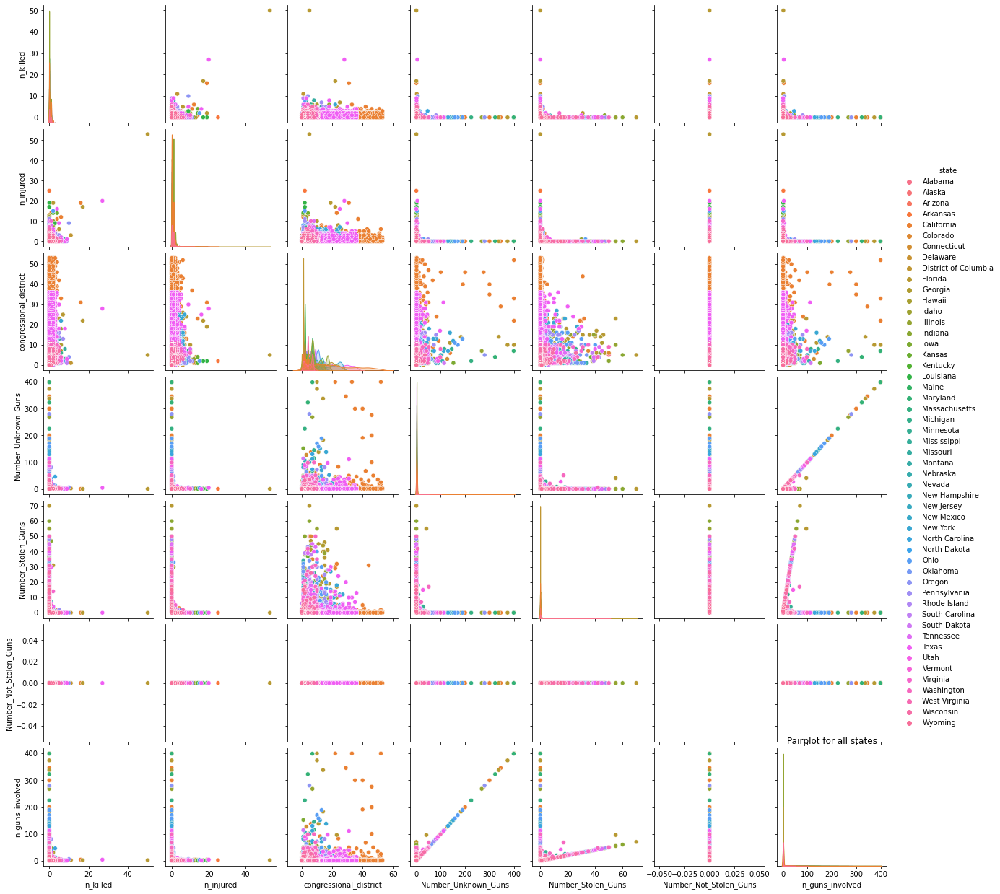

In [36]:
sns.pairplot(pair_df, kind='scatter',hue='state')
plt.title('Pairplot for all states')
plt.show()

### Pair plot by state

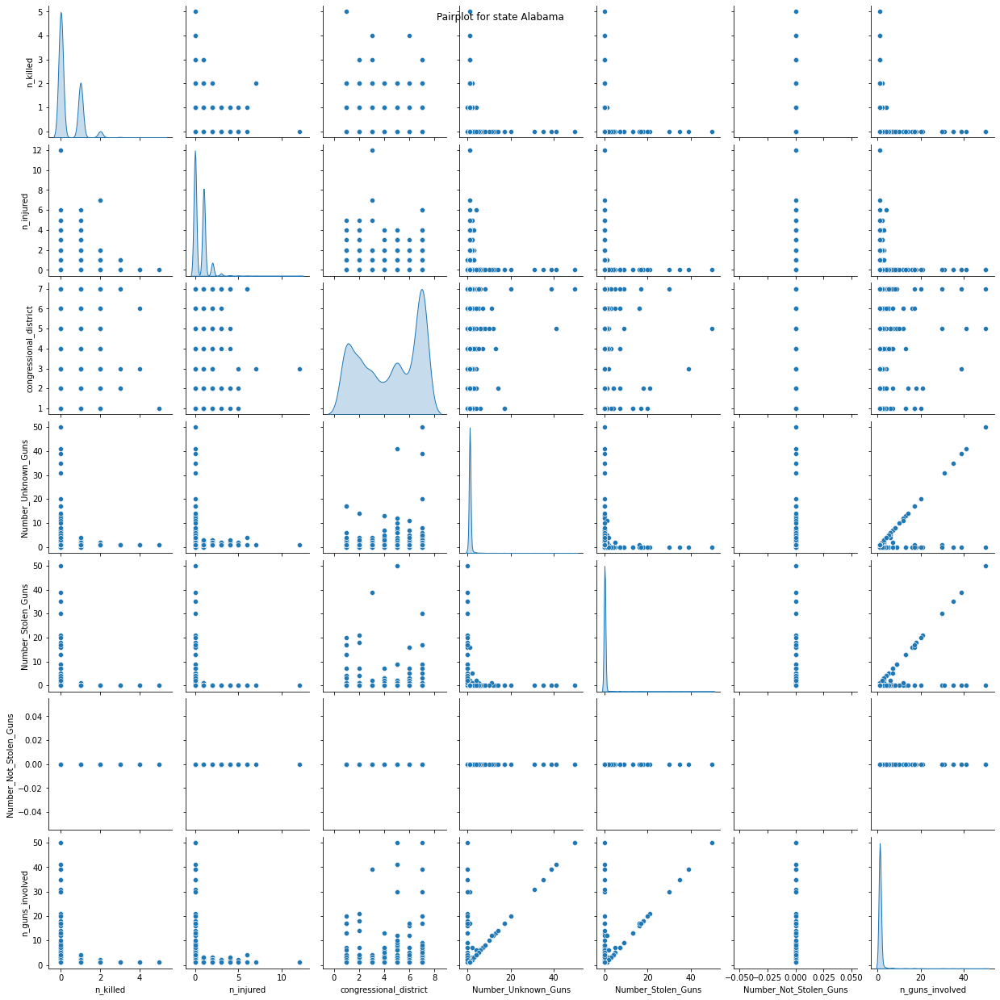

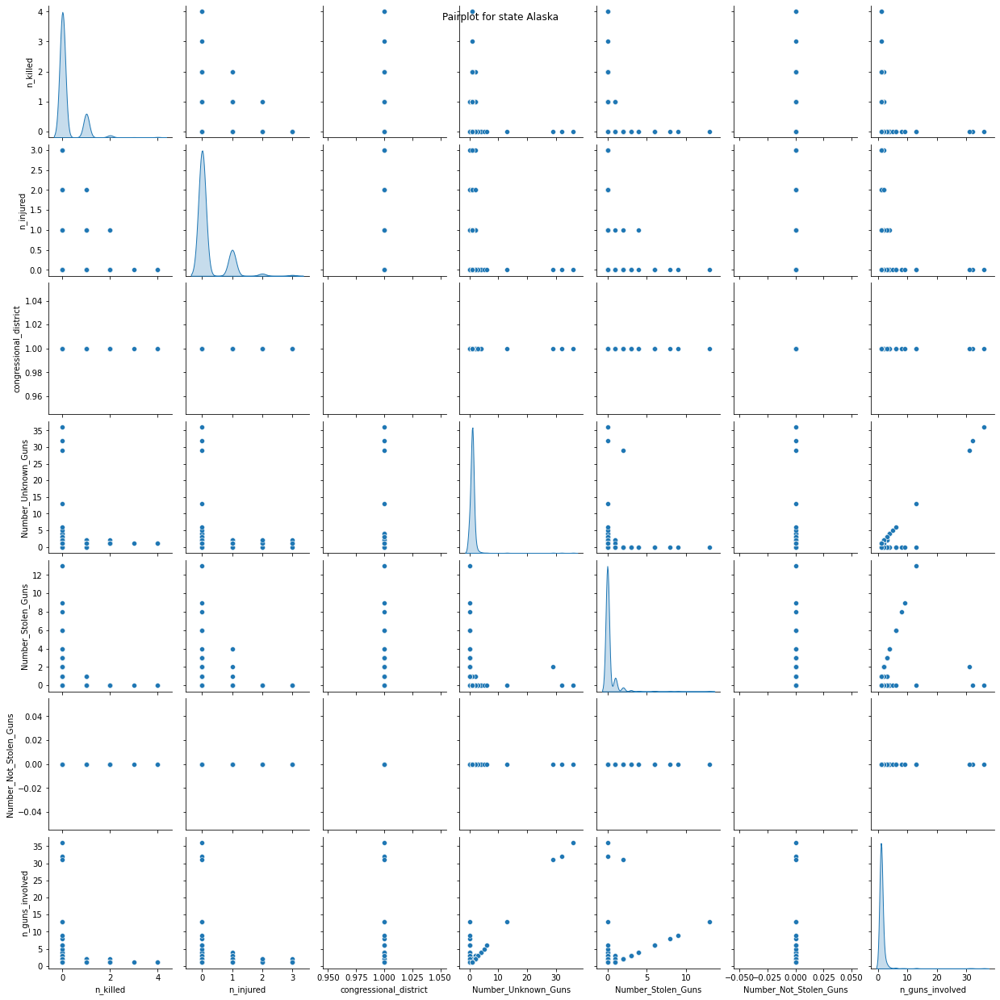

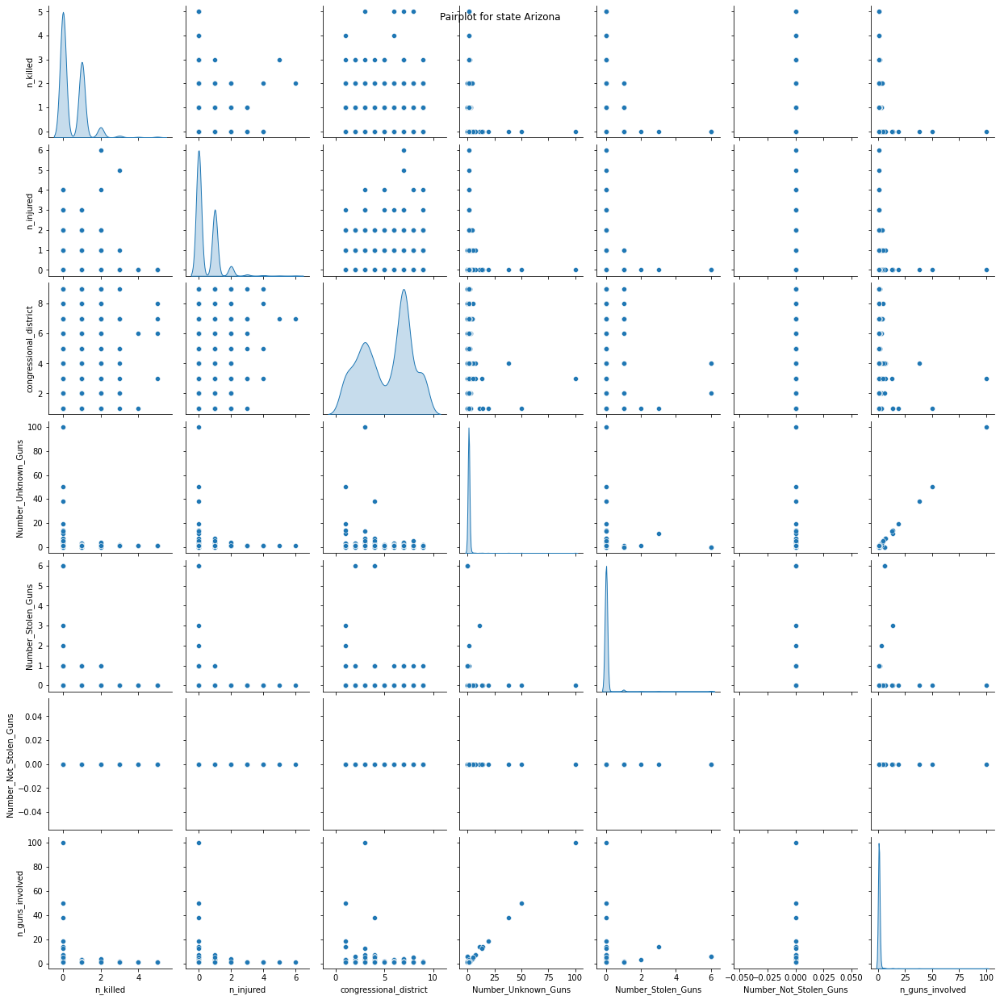

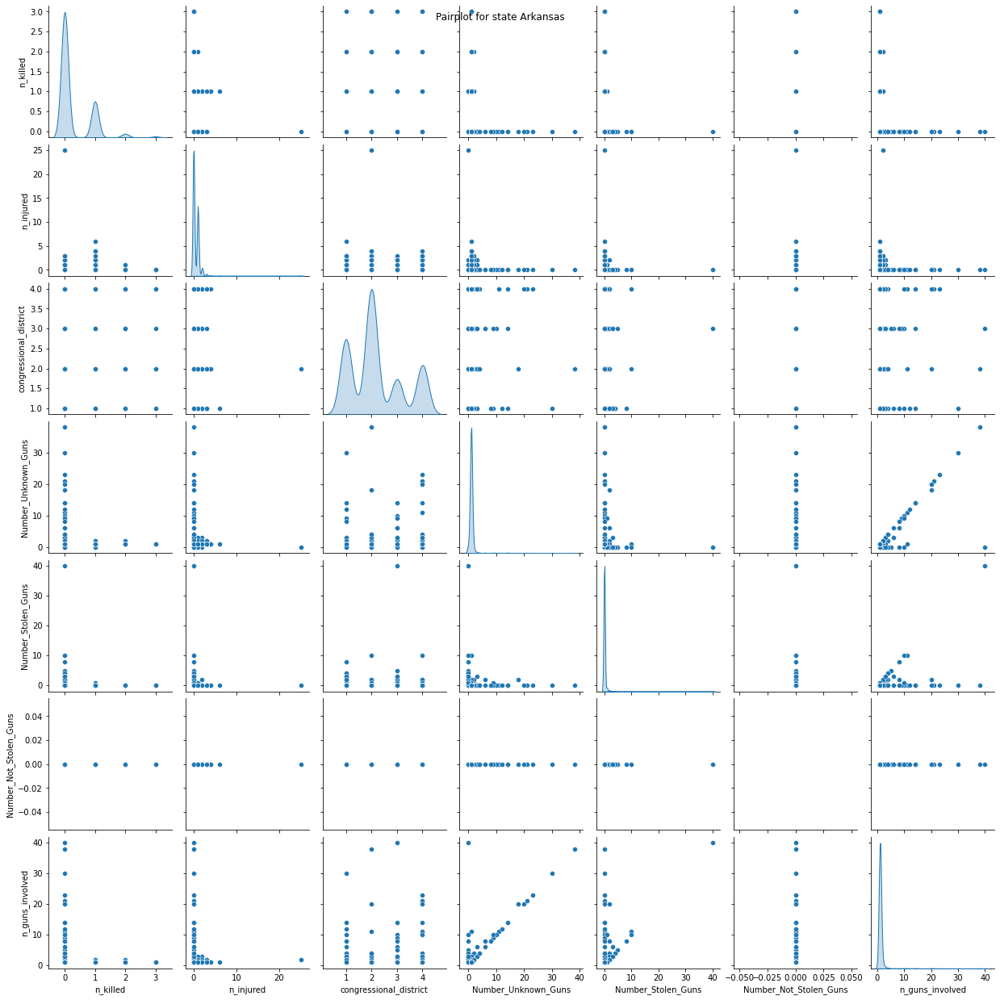

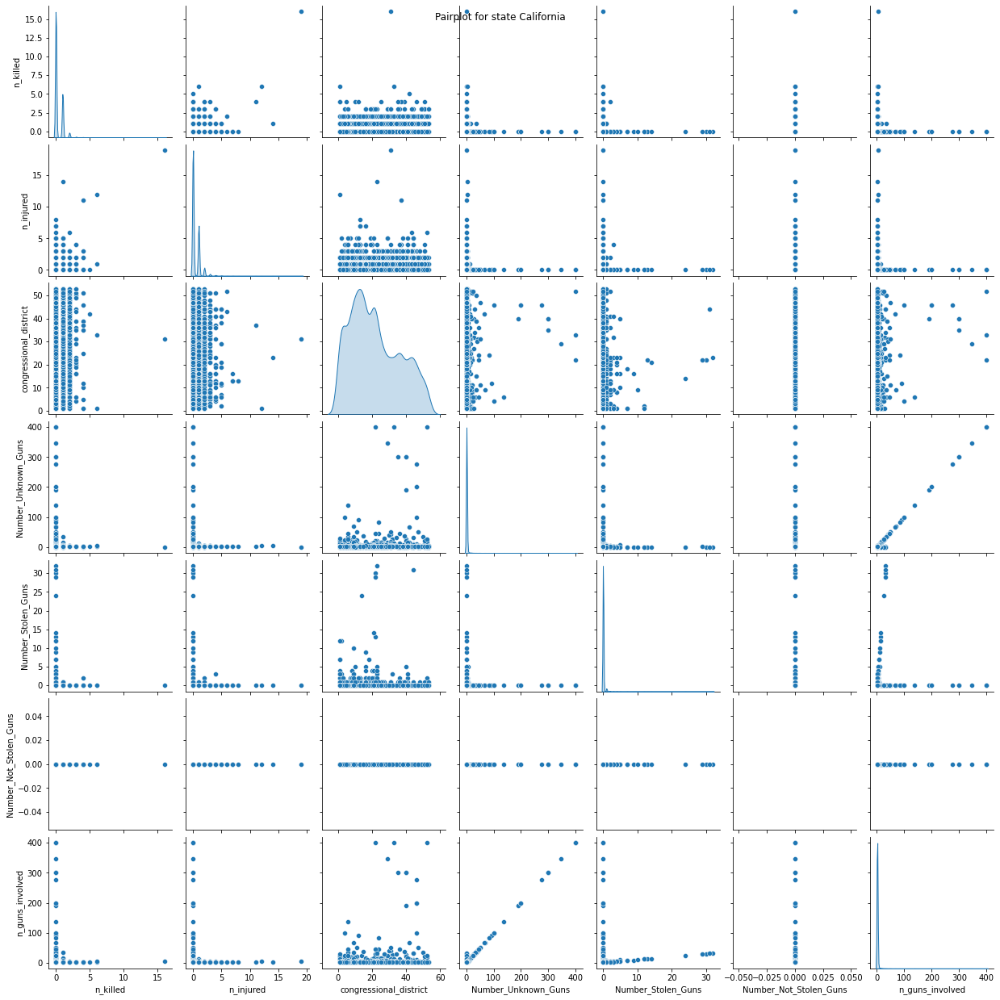

...

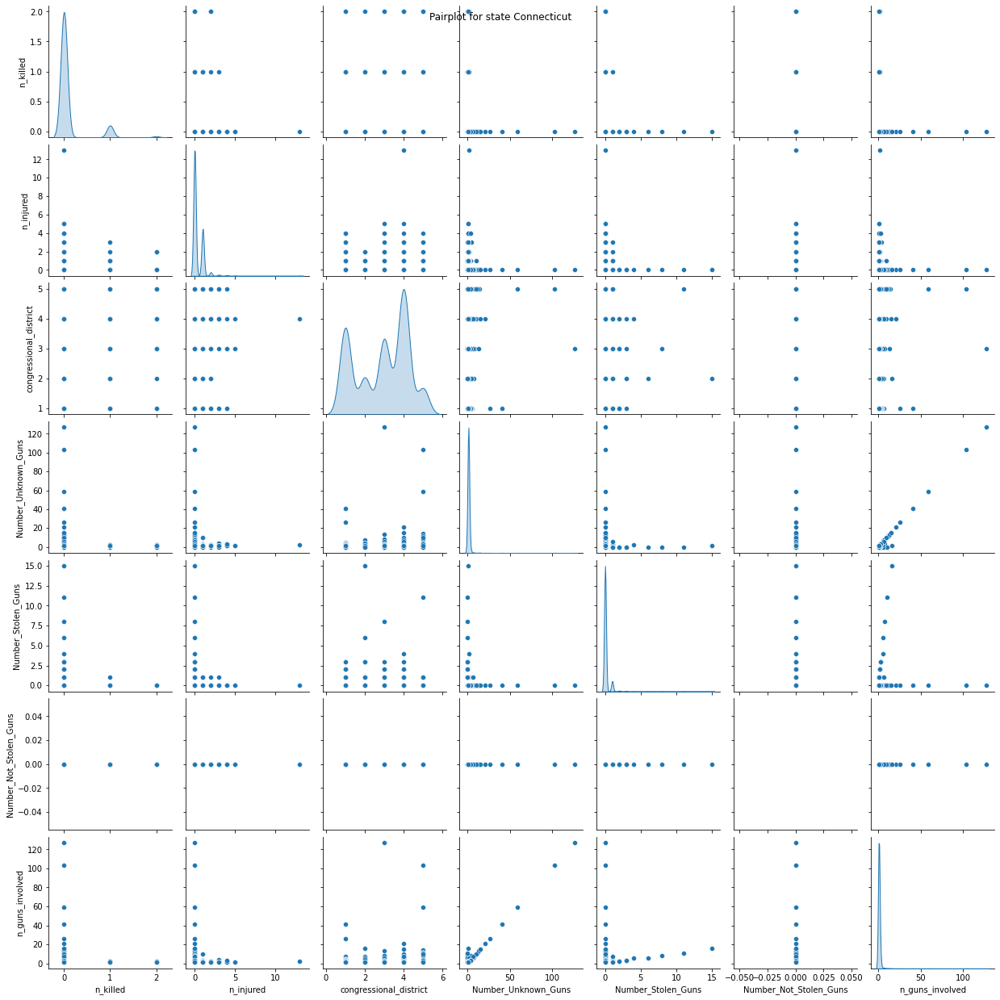

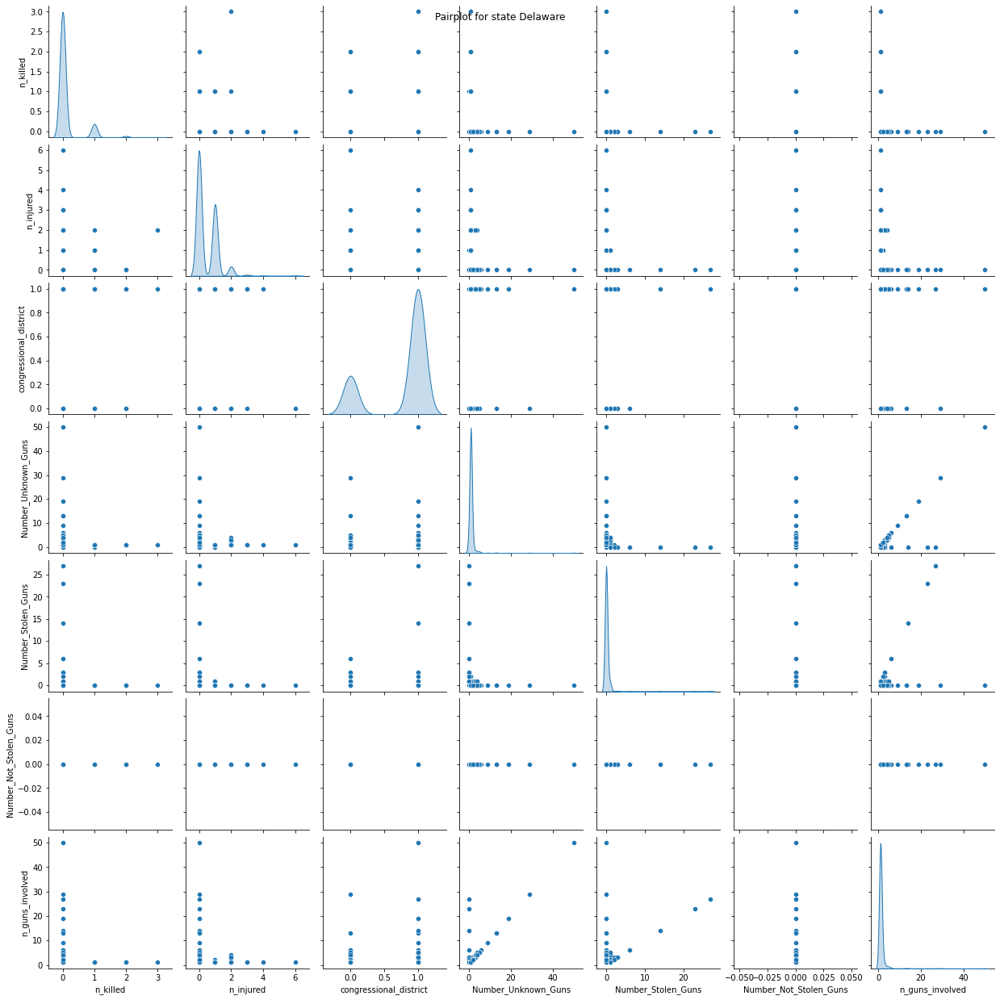

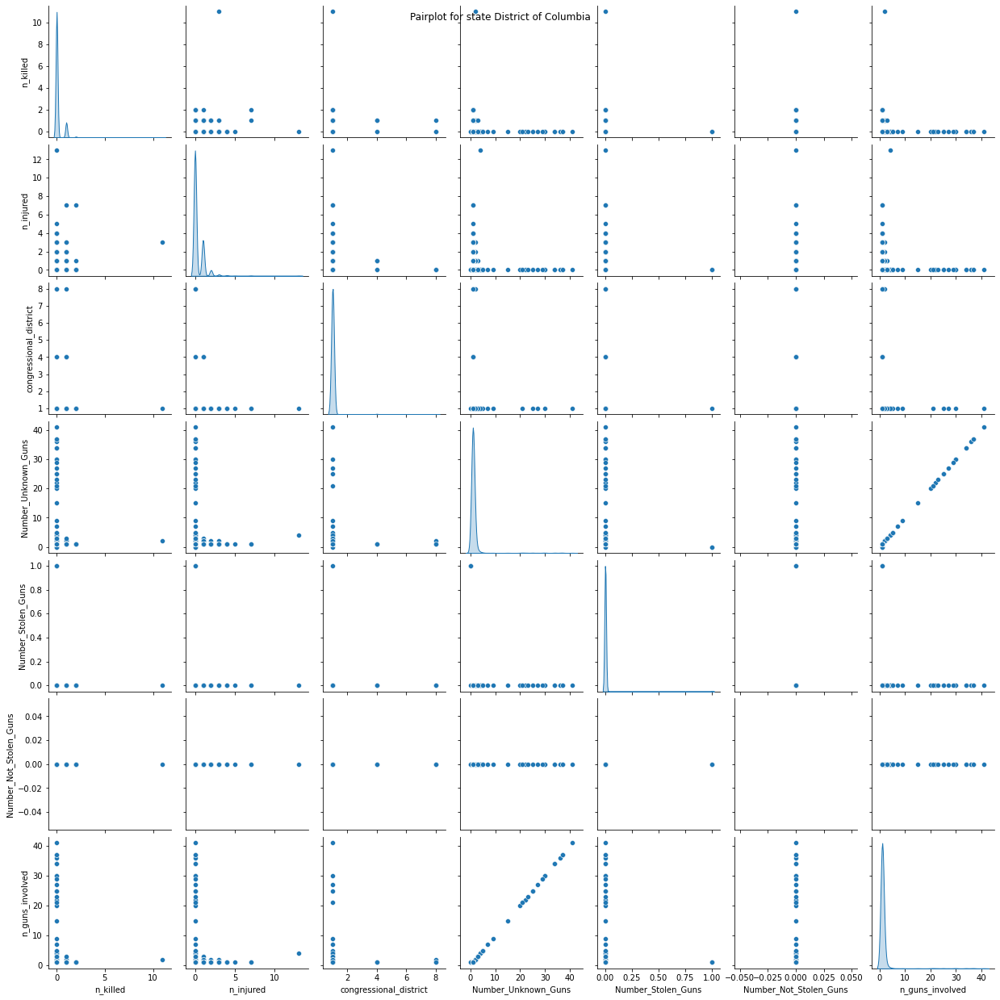

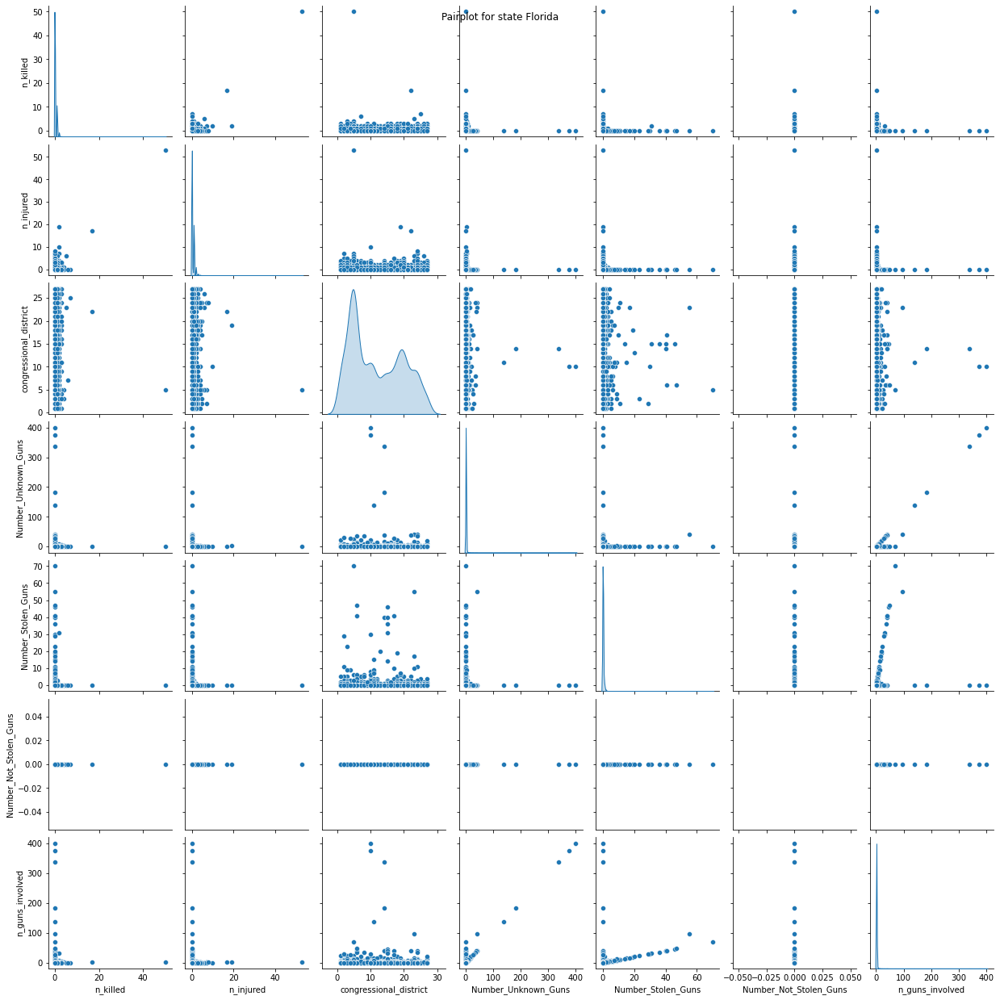

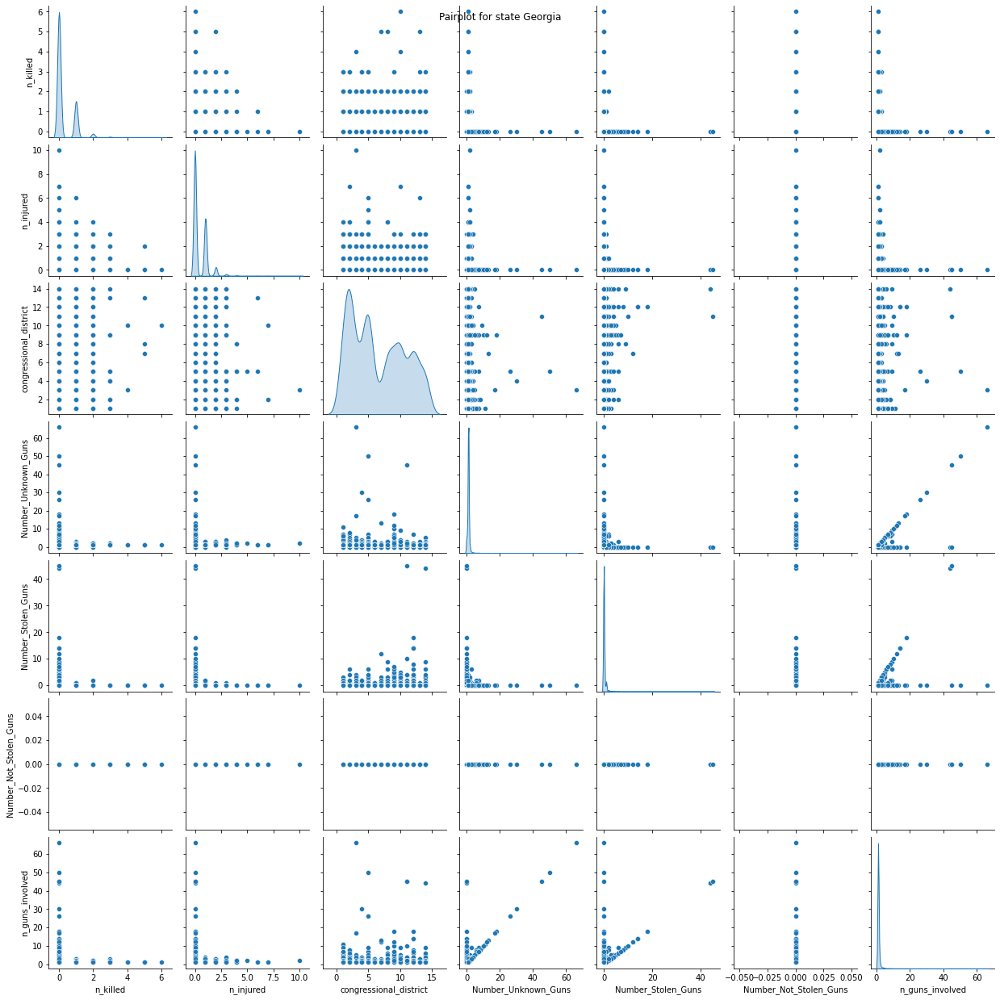

C:\Users\15599\Anaconda\lib\site-packages\seaborn\axisgrid.py:1278: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  self.hue_vals = pd.Series(["_nolegend_"] * len(data),


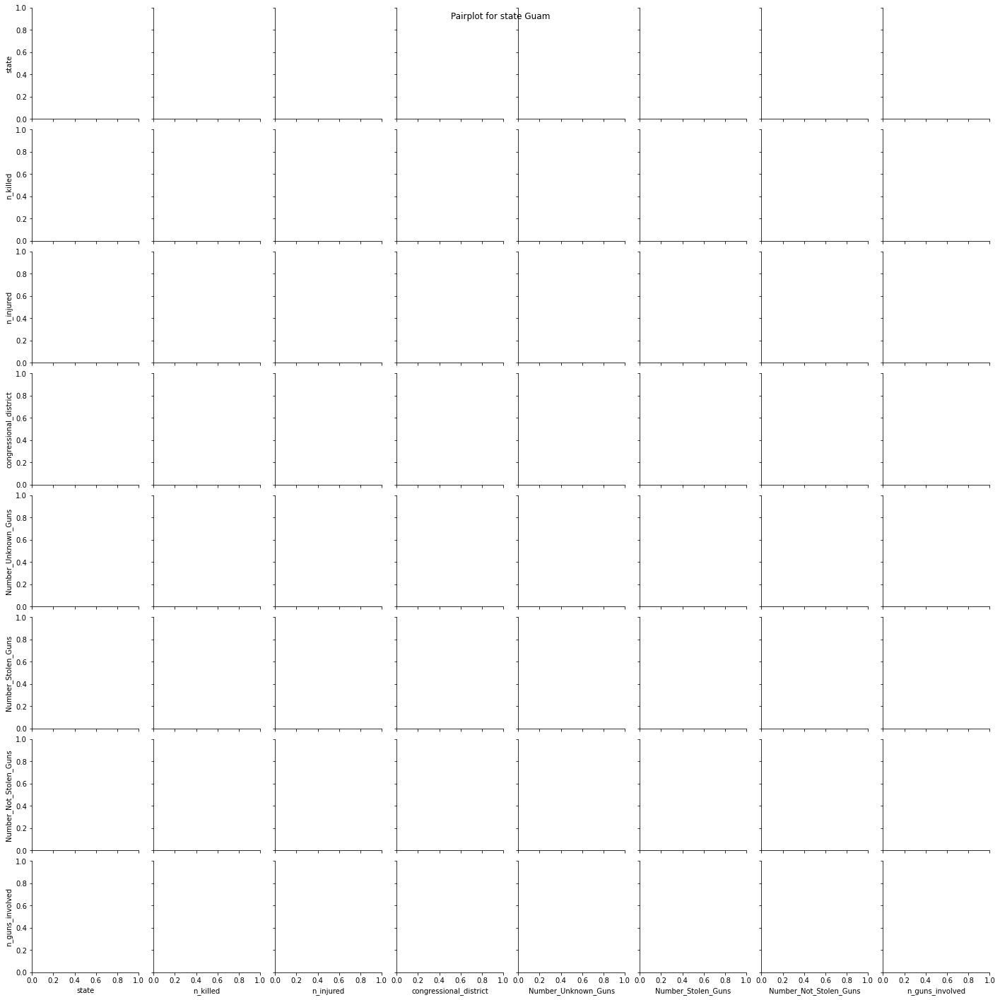

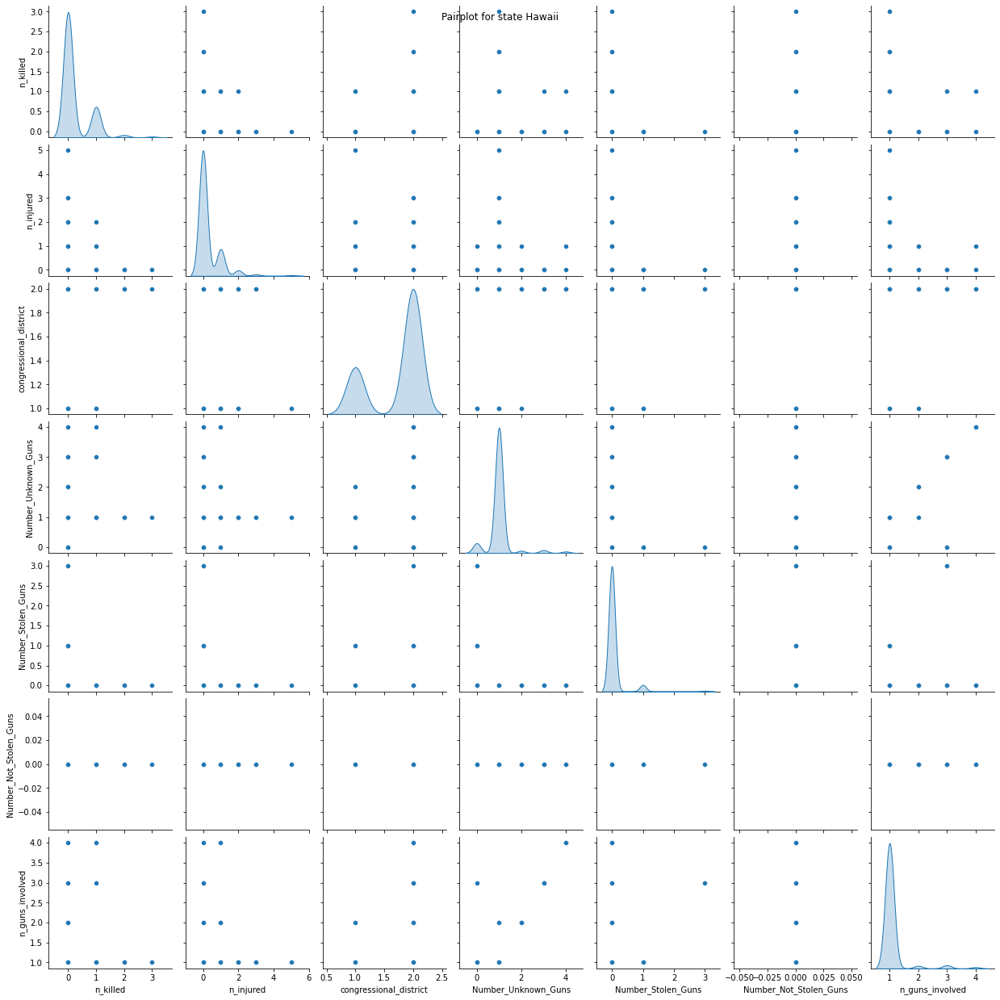

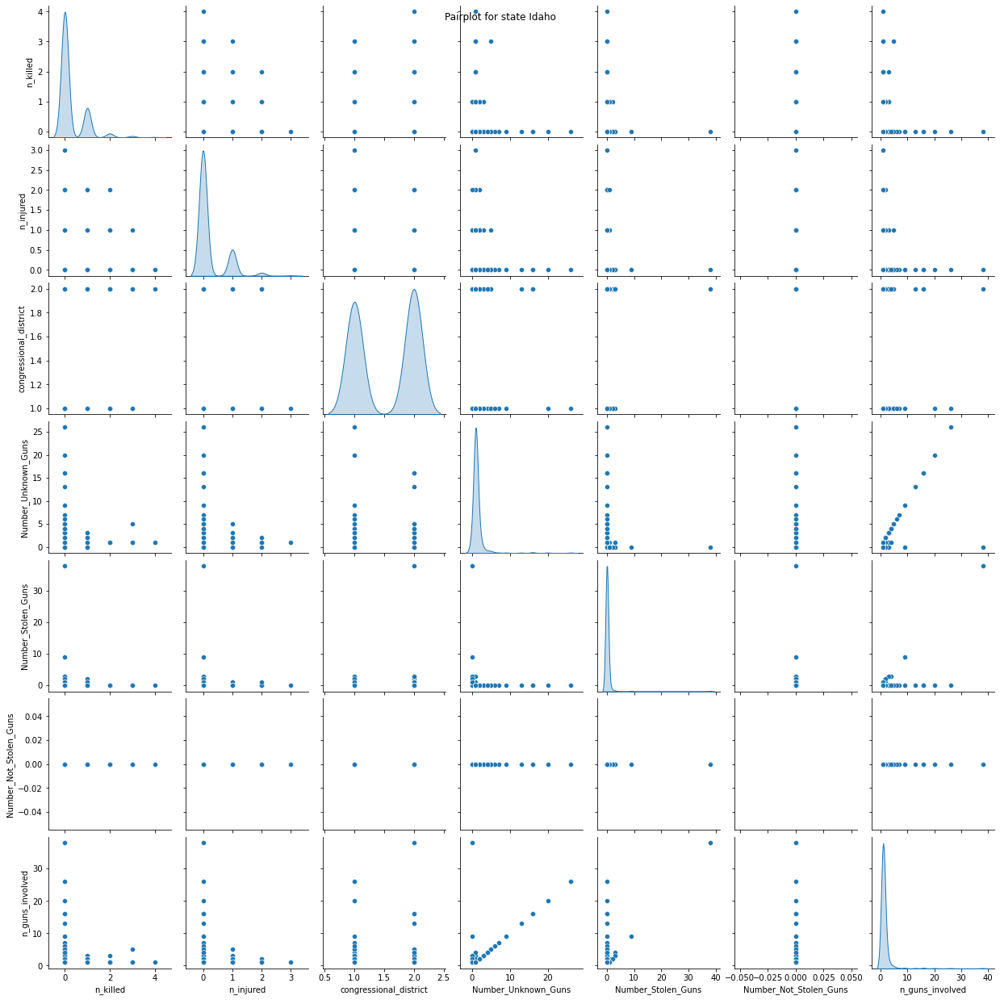

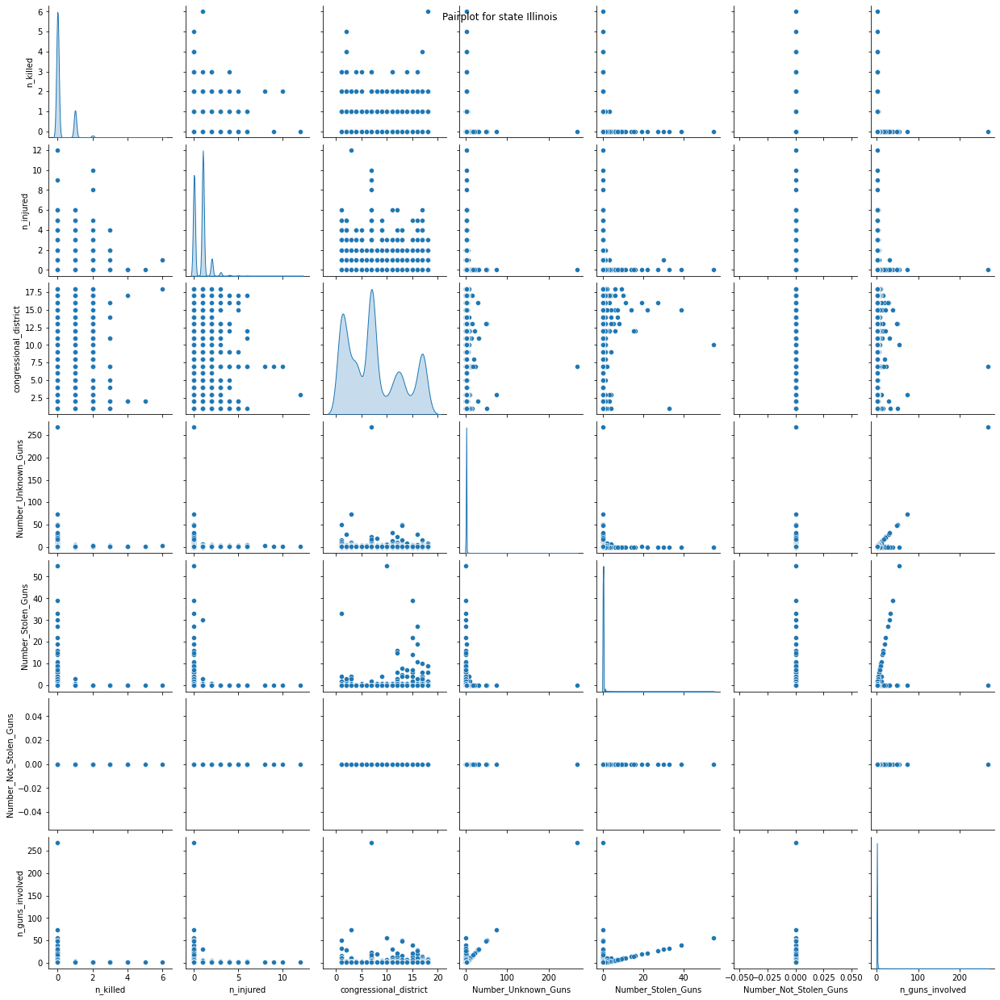

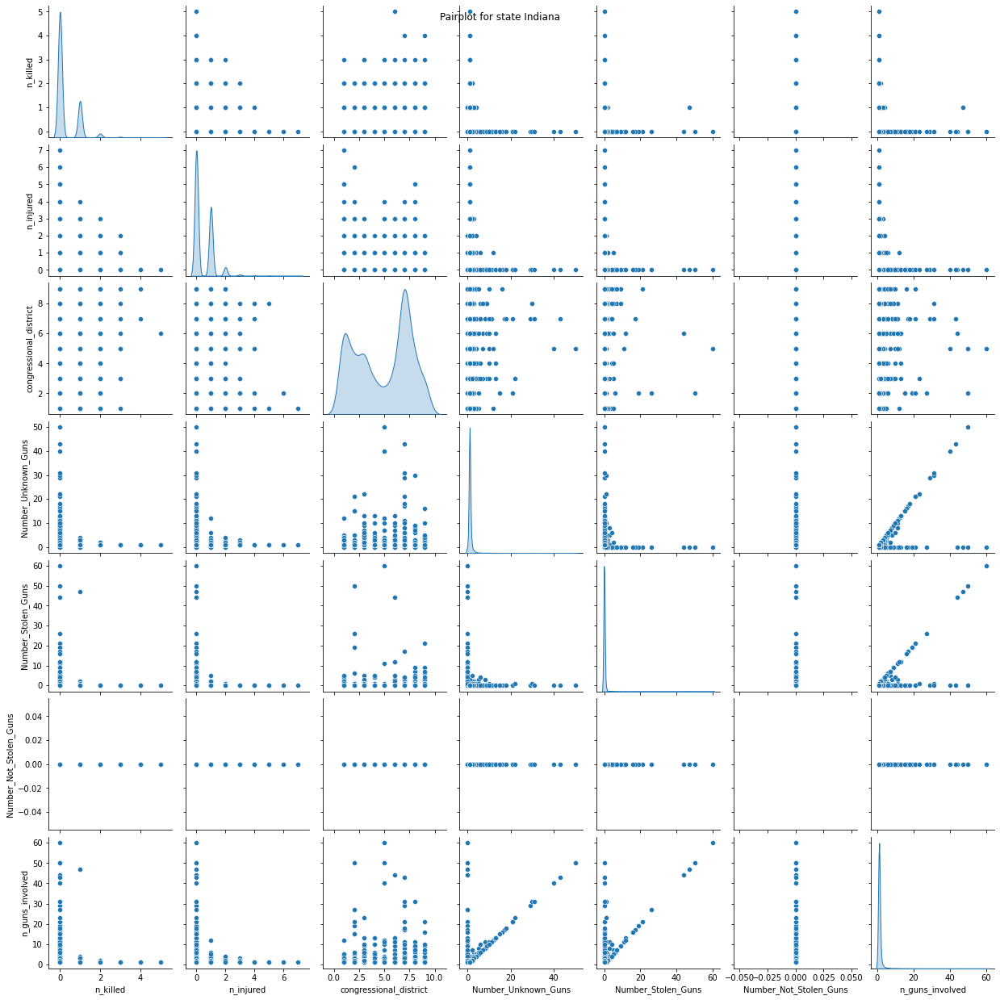

...

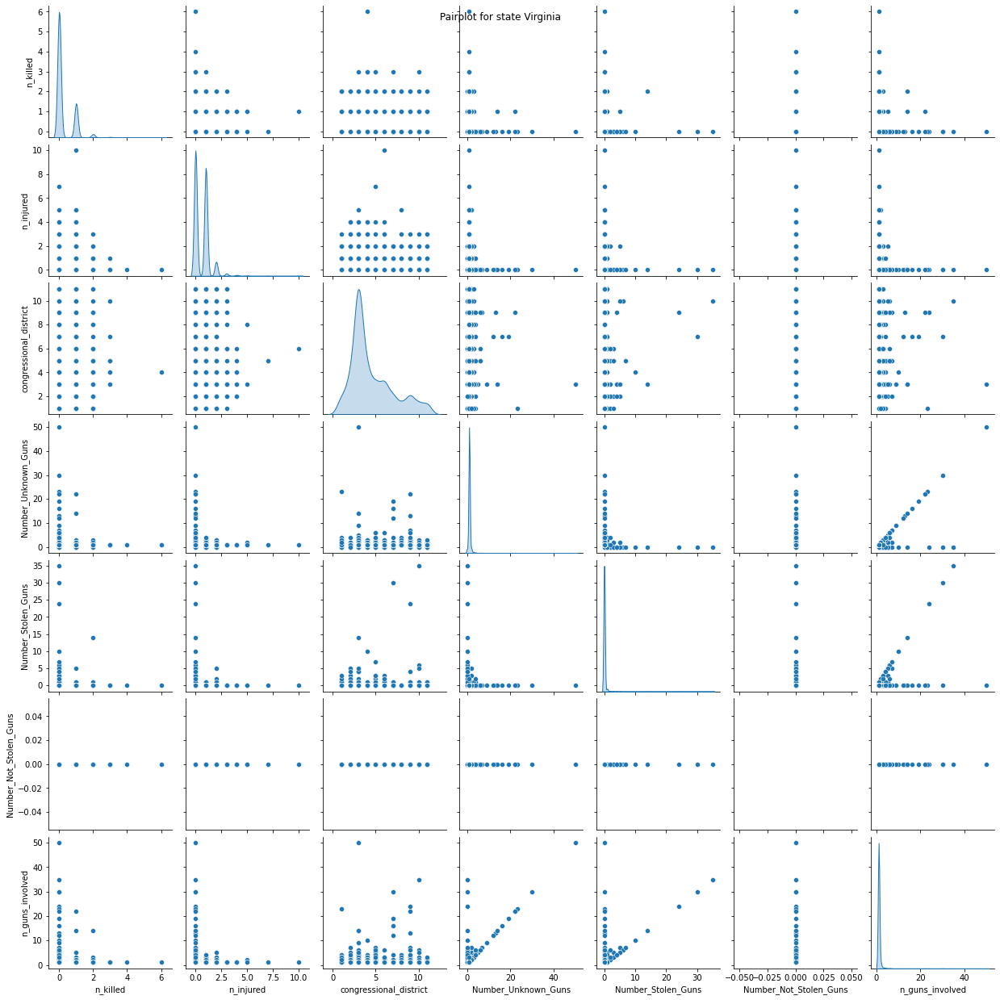

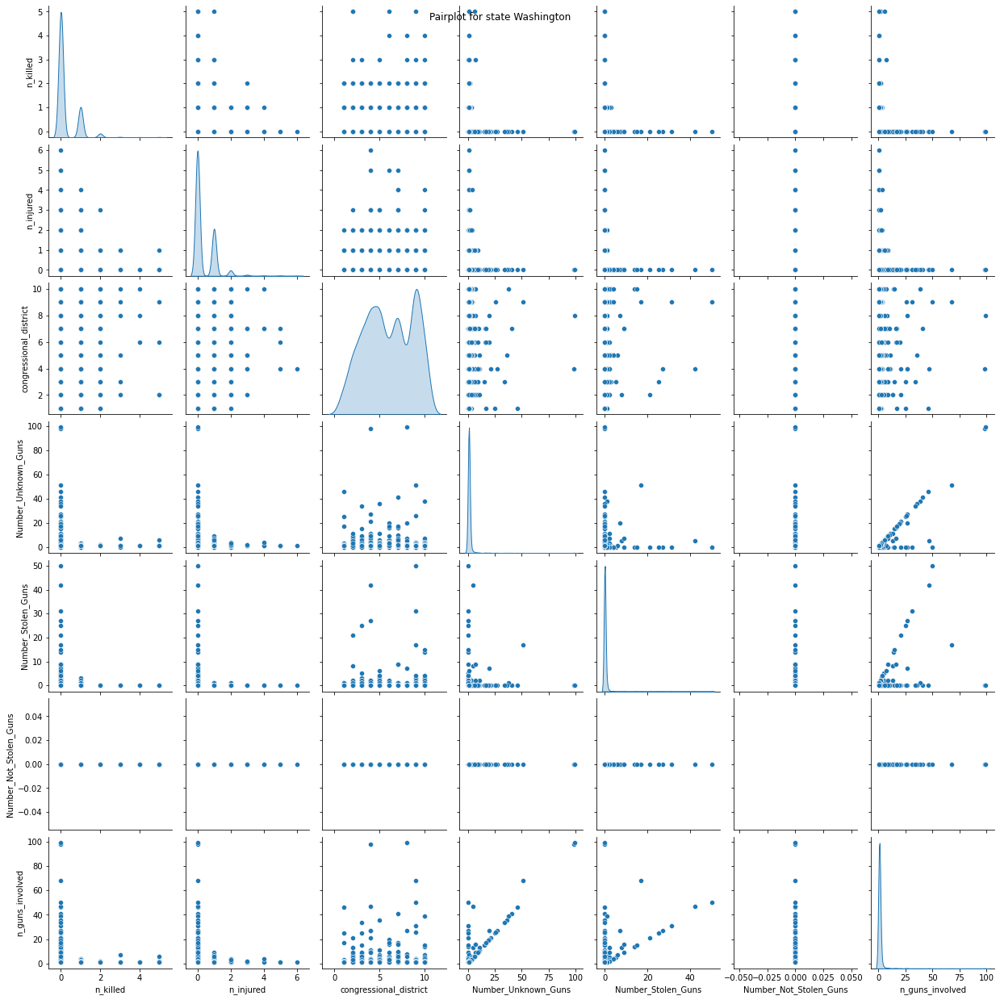

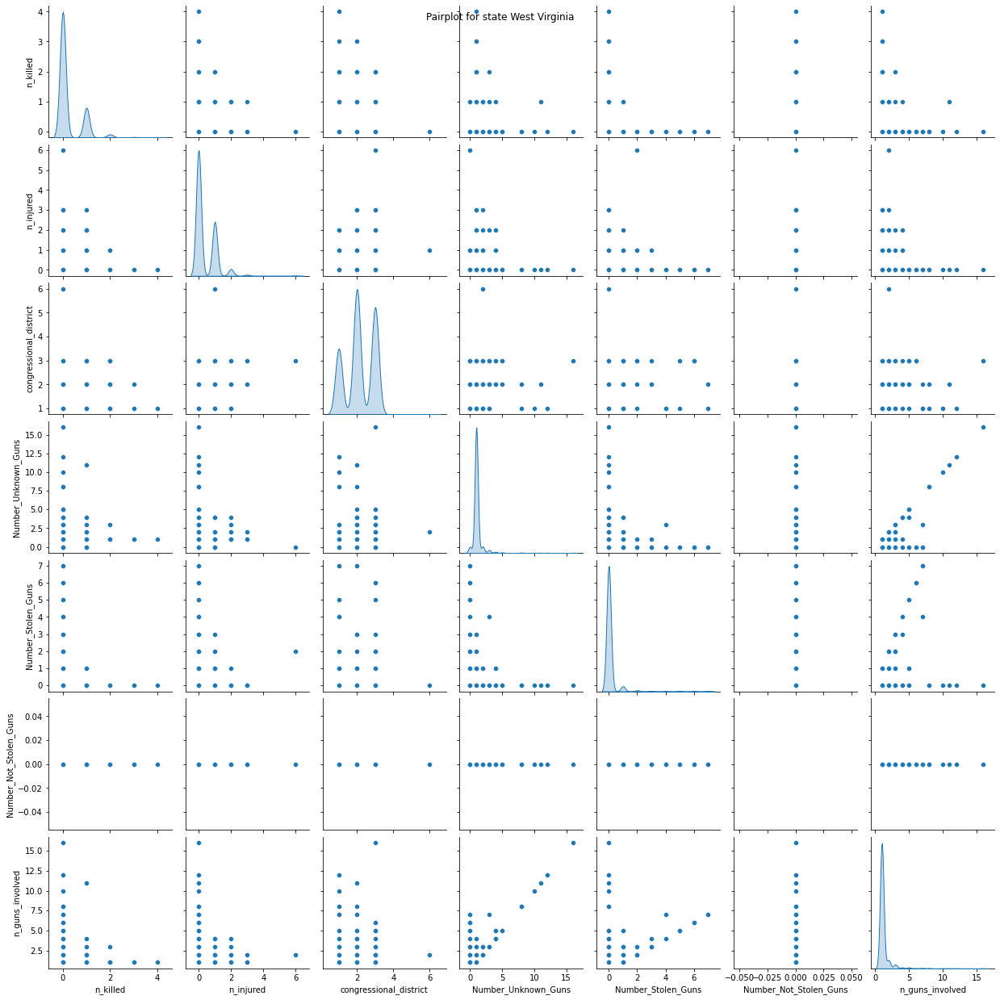

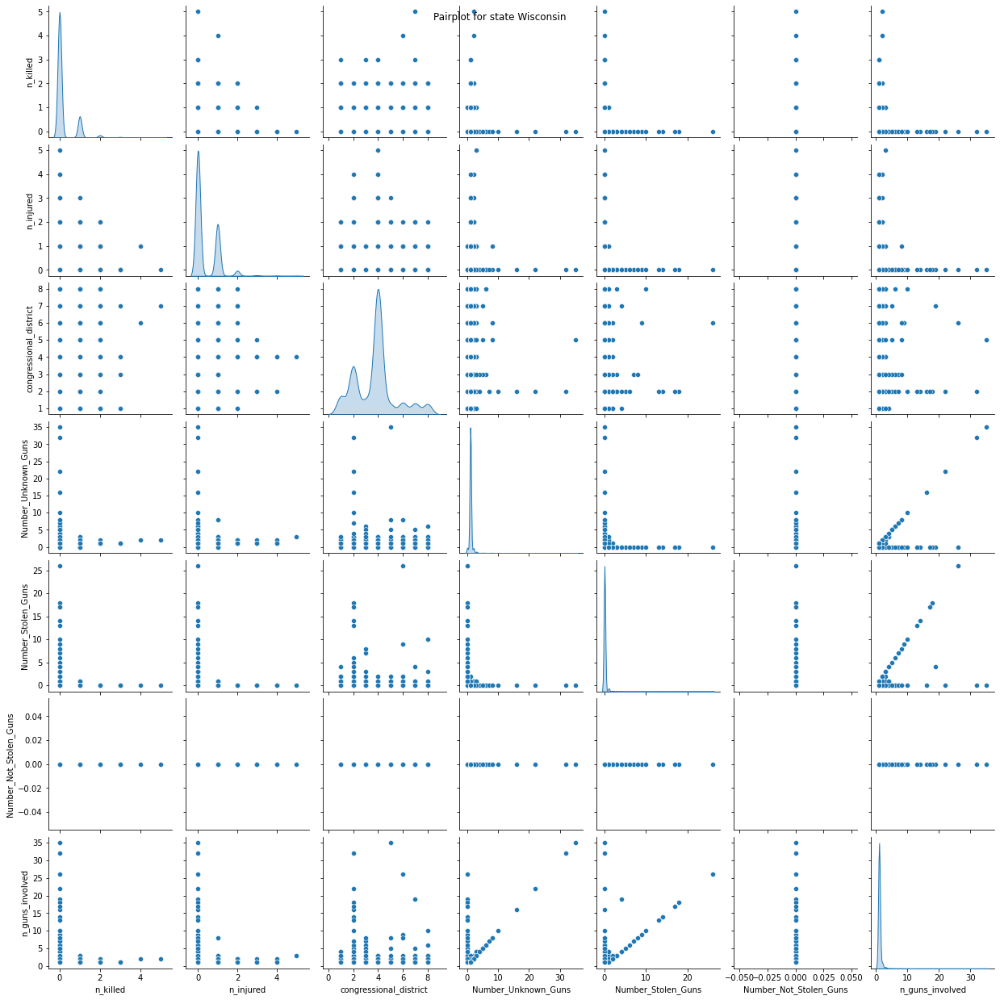

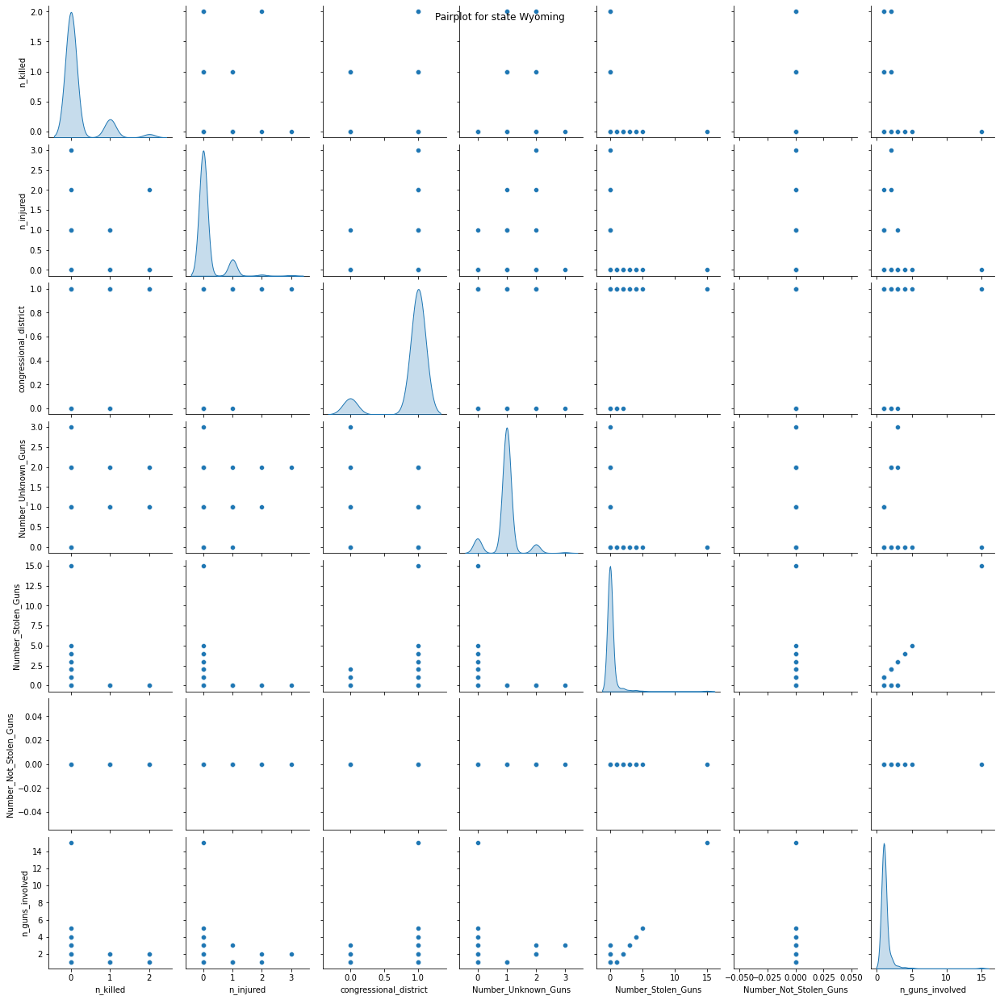

In [37]:
state_names = ["Alaska", "Alabama", "Arkansas", "Arizona", "California", "Colorado", "Connecticut", 
               "District of Columbia", "Delaware", "Florida", "Georgia", "Guam", "Hawaii", "Iowa", "Idaho", "Illinois", 
               "Indiana", "Kansas", "Kentucky", "Louisiana", "Massachusetts", "Maryland", "Maine", "Michigan", "Minnesota", 
               "Missouri", "Mississippi", "Montana", "North Carolina", "North Dakota", "Nebraska", "New Hampshire", 
               "New Jersey", "New Mexico", "Nevada", "New York", "Ohio", "Oklahoma", "Oregon", "Pennsylvania", 
               "Rhode Island", "South Carolina", "South Dakota", "Tennessee", "Texas", "Utah", "Virginia", 
               "Vermont", "Washington", "Wisconsin", "West Virginia", "Wyoming"]
for state in sorted(state_names) :
    sns.pairplot(pair_df[pair_df['state']==state],kind='scatter',diag_kind='kde')
    plt.suptitle('Pairplot for state {}'.format(state))
    plt.show()

### Histogram of States vs Incidents

<AxesSubplot:>

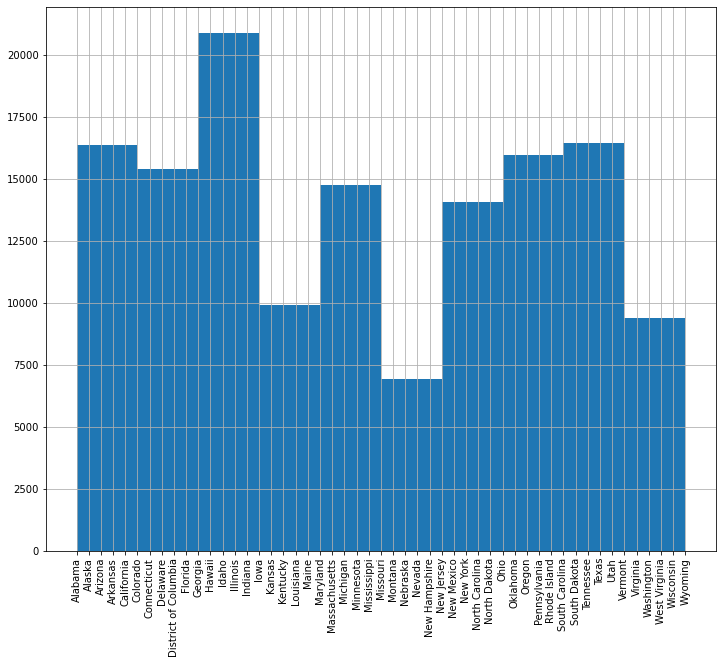

In [38]:
temp6['state'].hist(xrot=90, figsize=(12.0,10.0))

### Longitude vs Latitude by Number Killed

Text(0.5, 0.98, 'Comparison of Number of Killed by Longitude and Latitude')

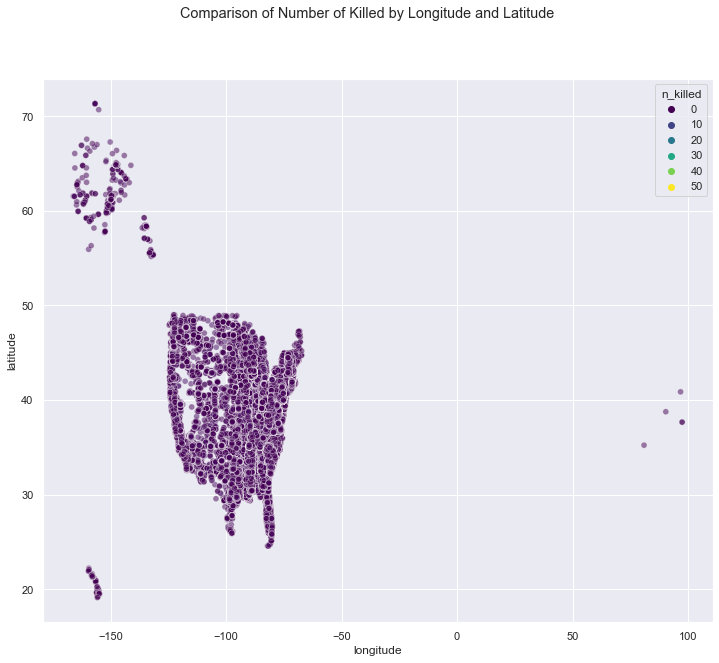

In [56]:
# just an idea
sns.scatterplot(data = temp3, x="longitude", y="latitude", hue="n_killed",
                    palette="viridis", alpha=0.5)
plt.suptitle(f"Comparison of Number of Killed by Longitude and Latitude")

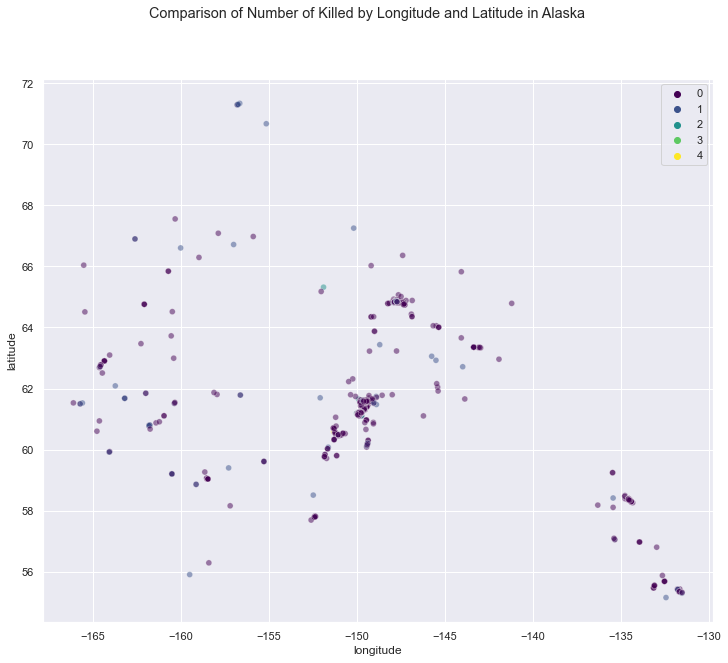

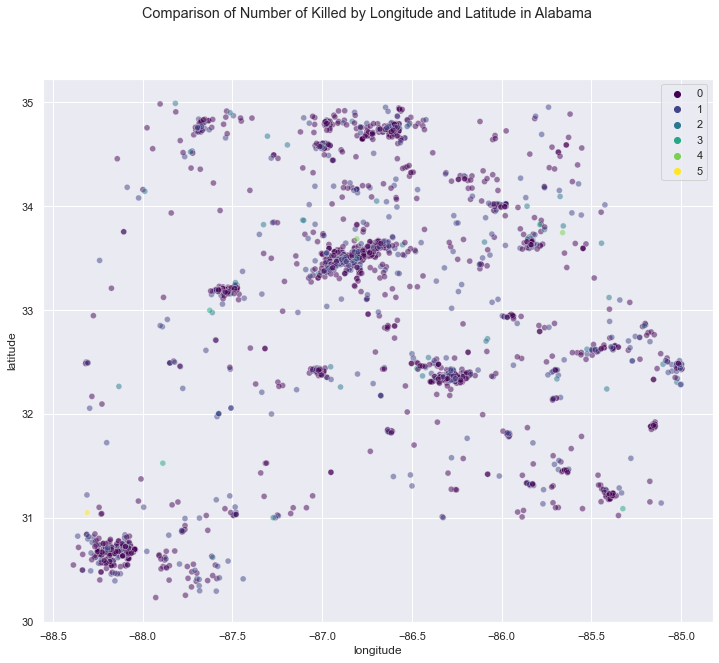

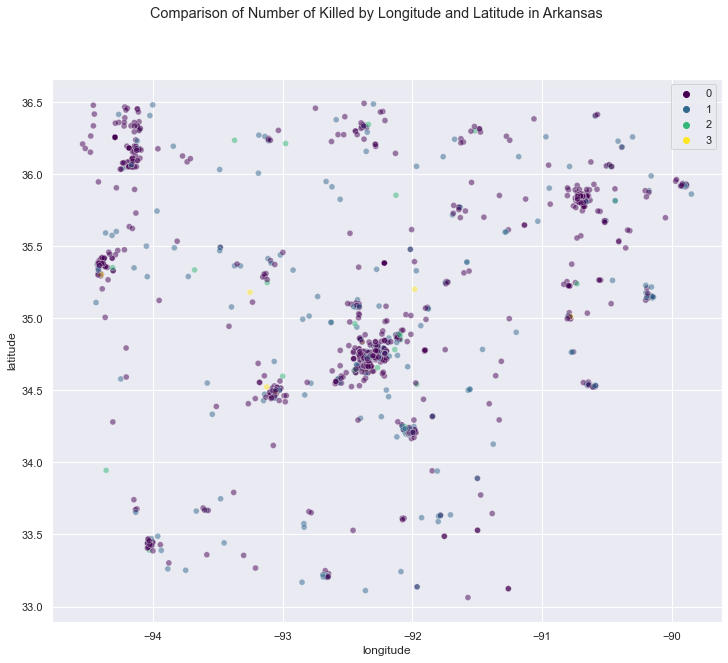

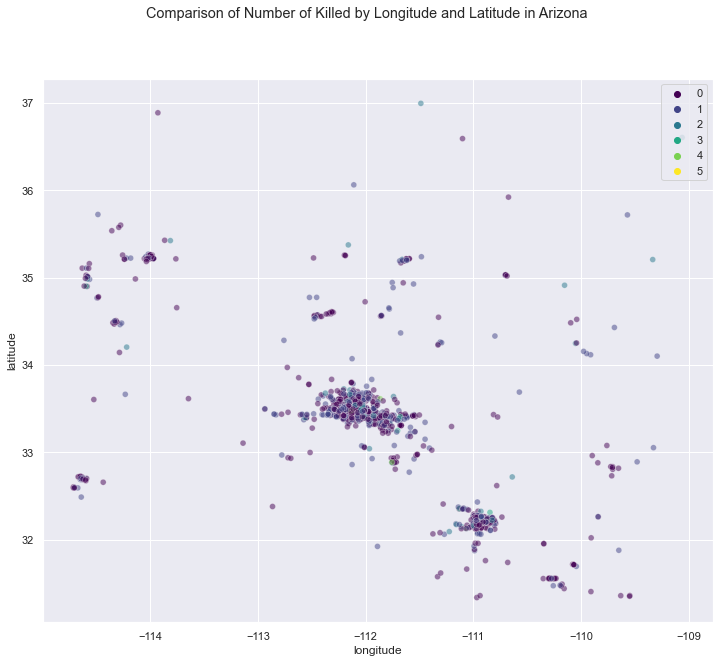

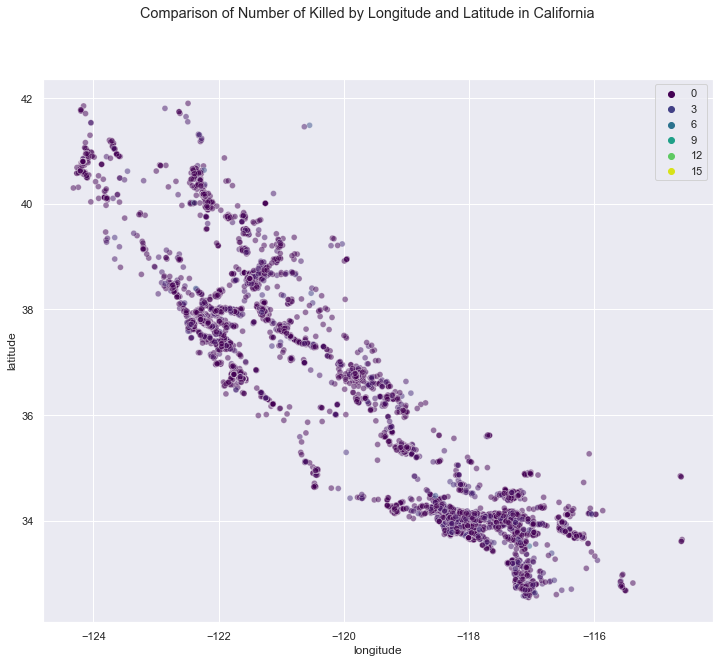

...

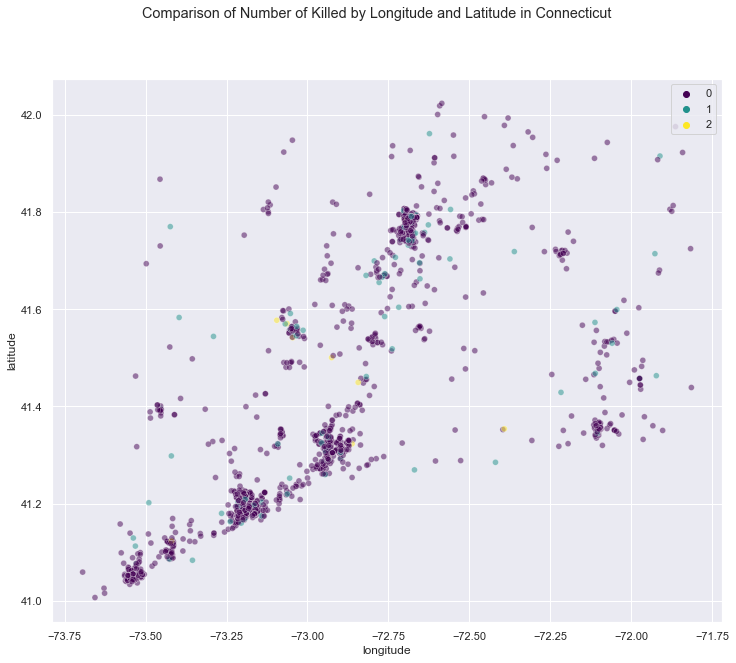

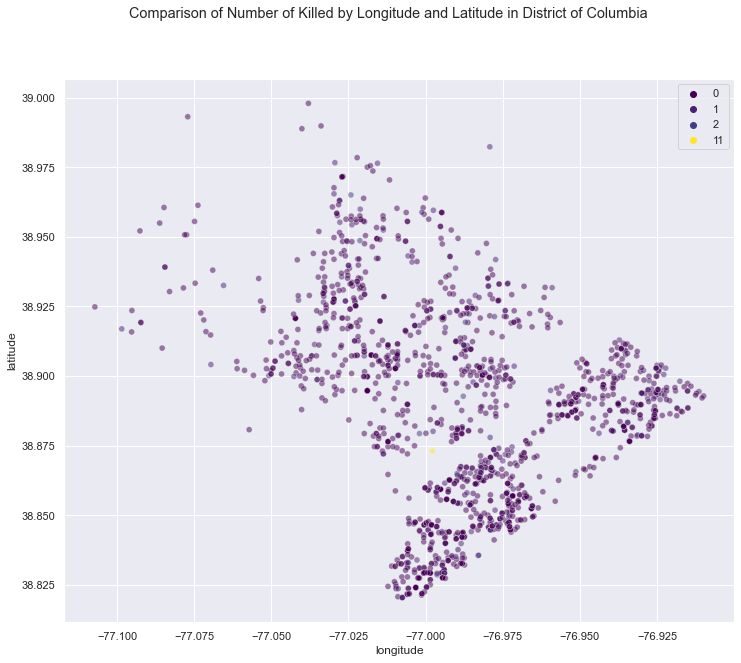

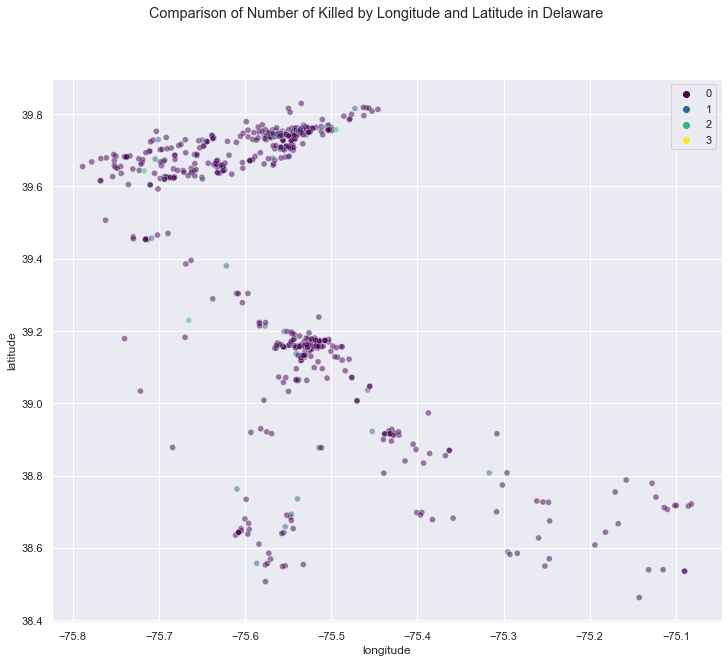

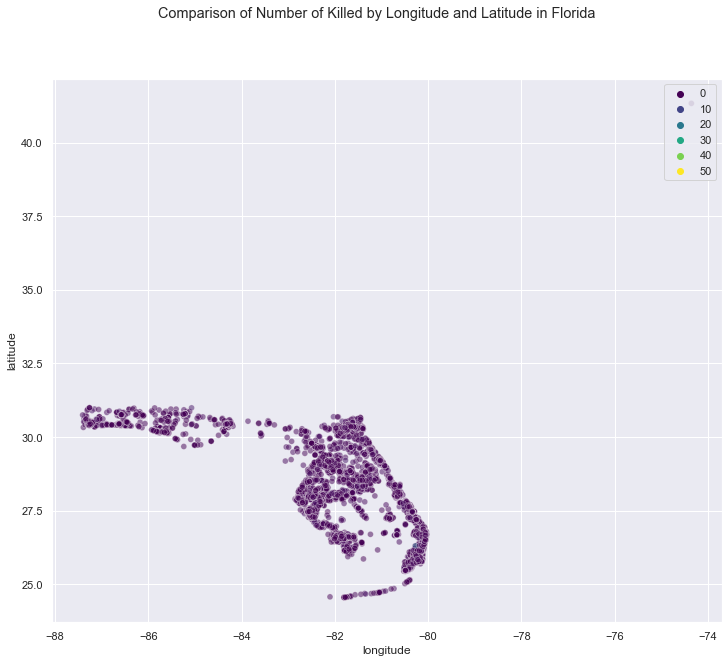

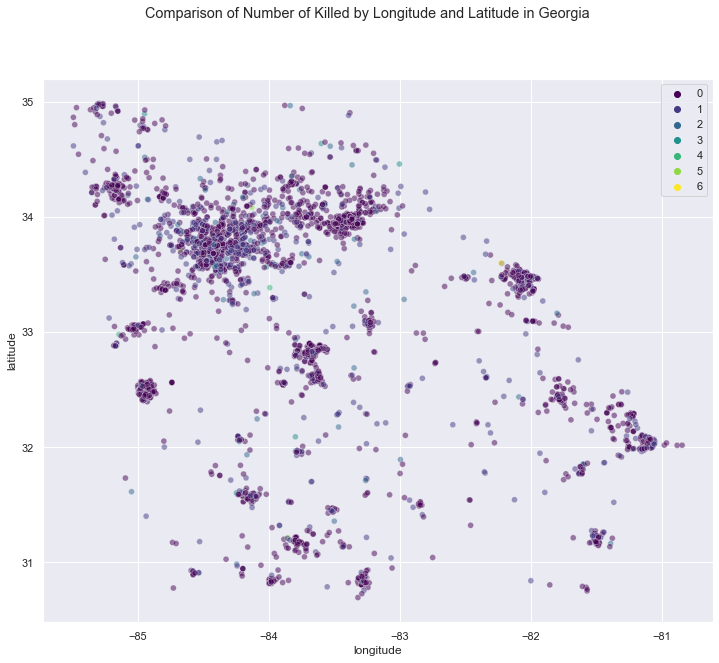

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


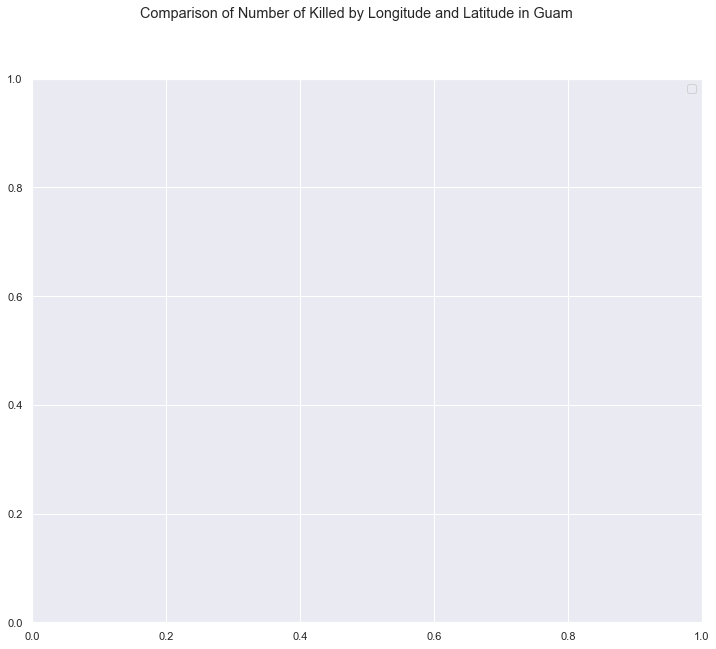

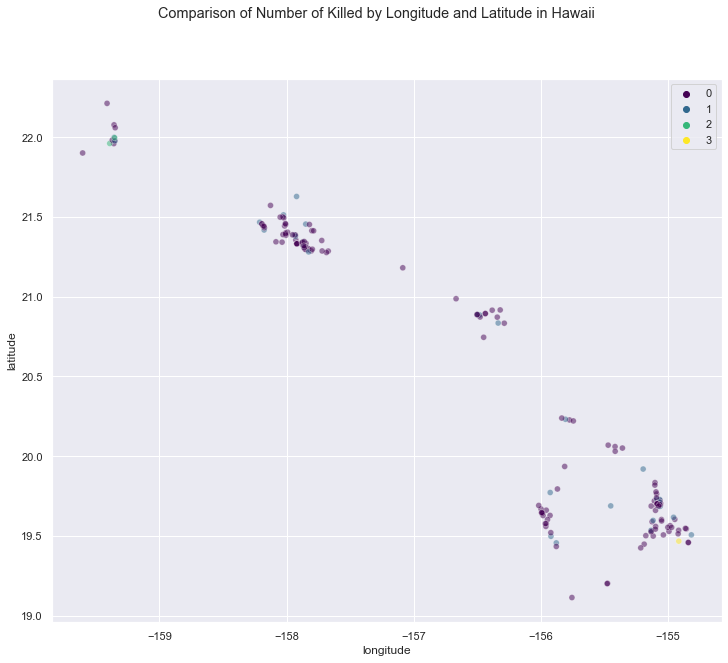

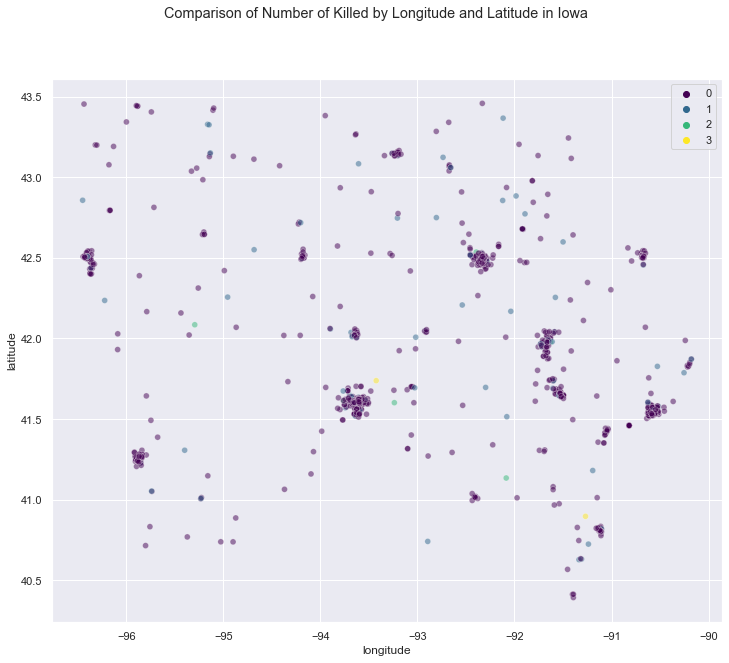

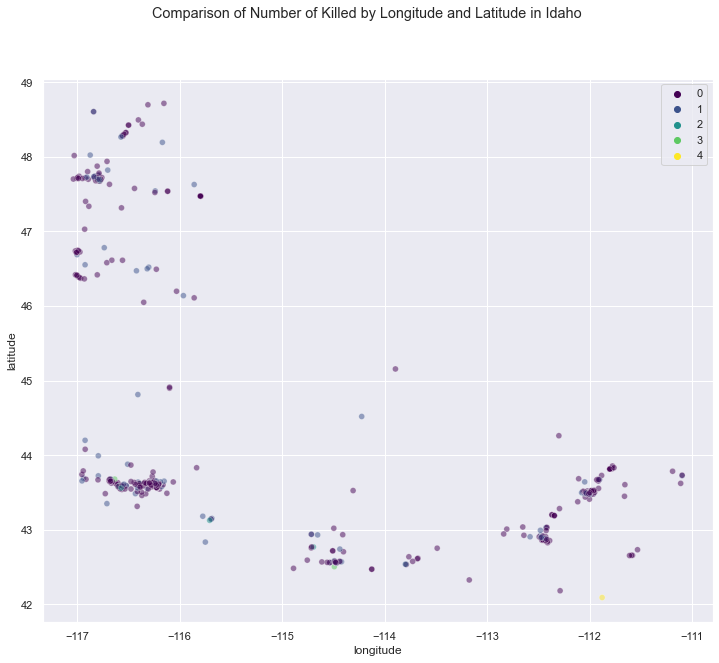

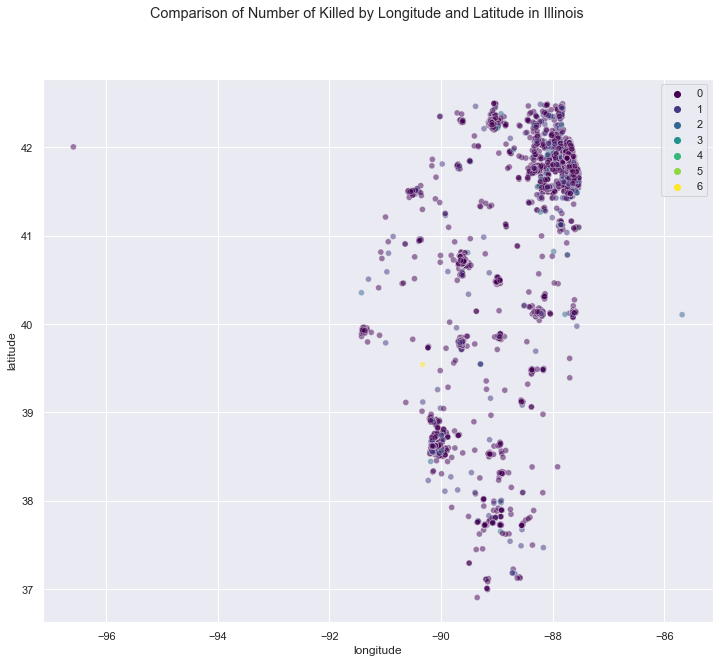

...

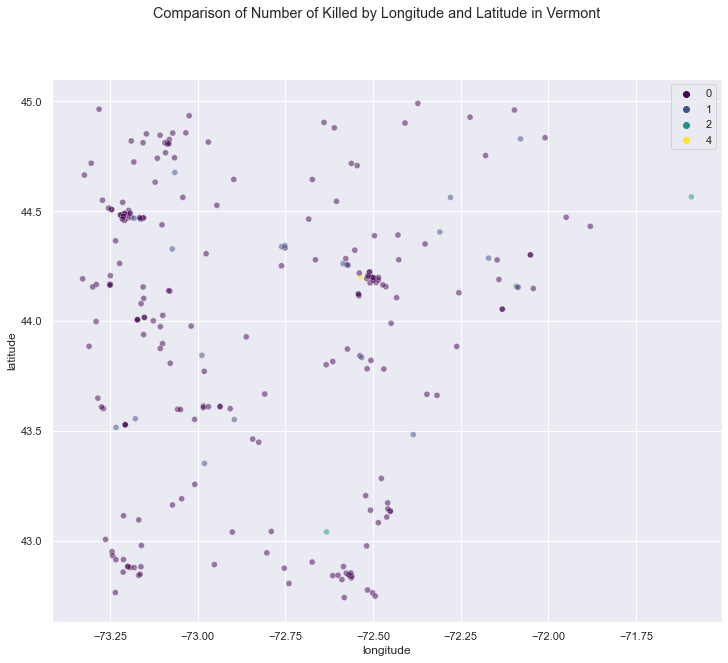

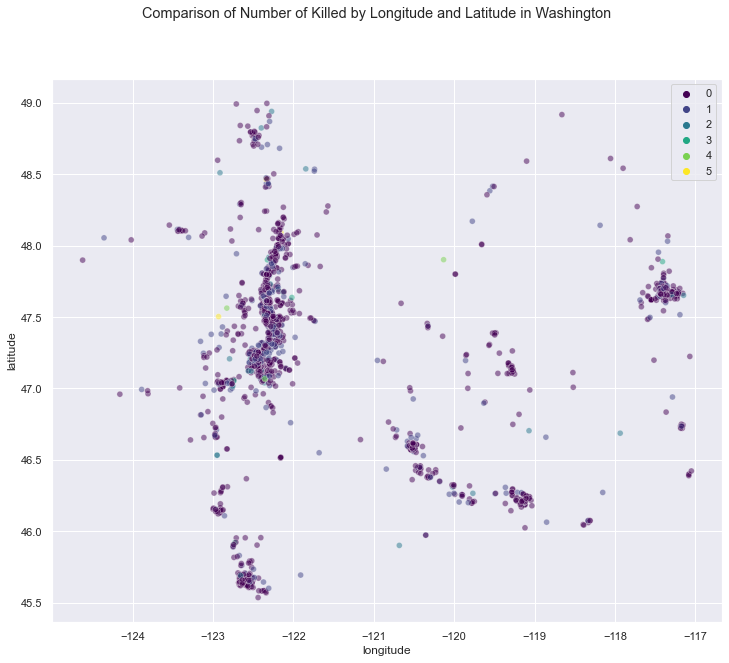

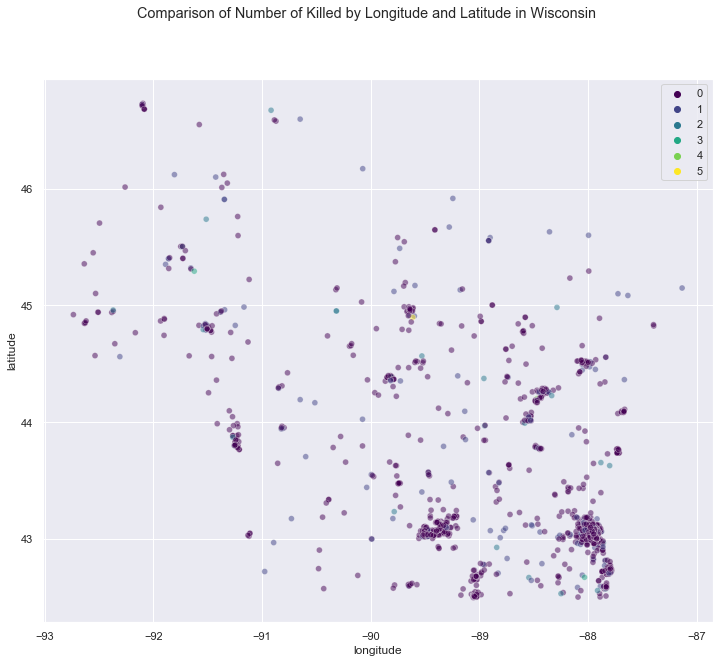

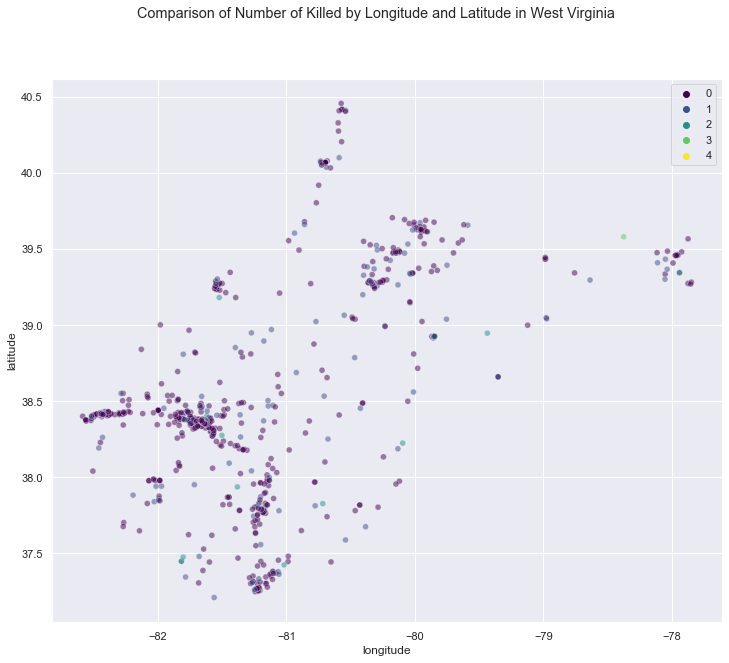

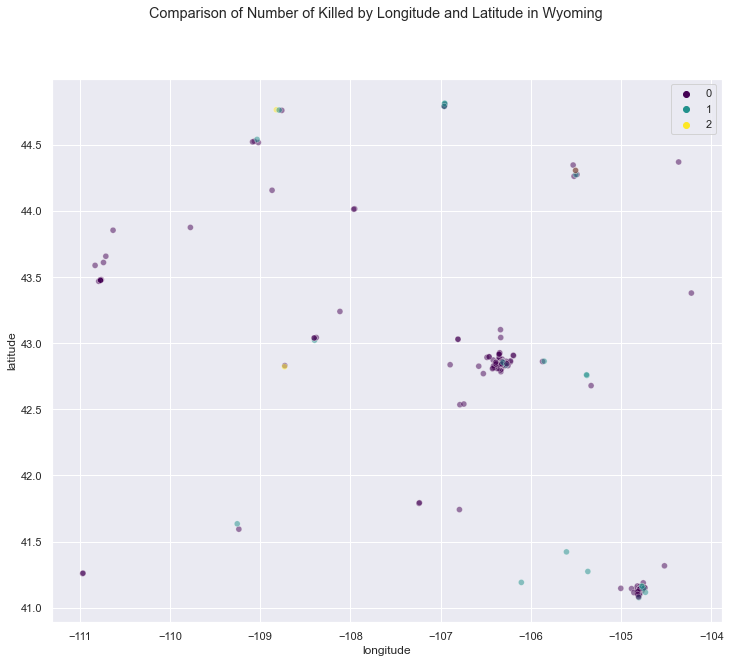

In [59]:
# just an idea
for state in state_names:
    sns.scatterplot(data = temp3[temp3['state']==state], x="longitude", y="latitude", hue="n_killed",
                    palette="viridis", alpha=0.5)
    plt.suptitle(f"Comparison of Number of Killed by Longitude and Latitude in {state}")
    plt.legend(loc = "upper right")
    plt.show()

### Regression Models

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

In [ ]:
y = cali_housing.frame['n_killed']
X = cali_housing.frame.iloc[:,:8]